In [79]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import random
from spacy import displacy

In [80]:
!pip install -U spacy==3.*
!python -m spacy download en_core_web_sm
!python -m spacy info

Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
     ---------------------------------------- 12.8/12.8 MB 3.8 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_sm')

============================== Info about spaCy ==============================

spaCy version    3.7.4                         
Location         C:\Users\monyque220063\AppData\Roaming\Python\Python39\site-packages\spacy
Platform         Windows-10-10.0.22621-SP0     
Python version   3.9.13                        
Pipelines        en_core_web_sm (3.7.1)        



In [81]:
import spacy

from scipy import spatial
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics.pairwise import cosine_similarity

from sklearn.datasets import fetch_20newsgroups
from sklearn.feature_extraction.text import TfidfVectorizer

#### Aula 1 - Análise abstracts

In [82]:
arqs = os.listdir('../dados')

In [83]:
for i,arq in enumerate(arqs):
    
    if i == 0:
        df = pd.read_excel(f'../dados/{arq}')
    else:
        aux = pd.read_excel(f'../dados/{arq}')
        df = pd.concat([df,aux])

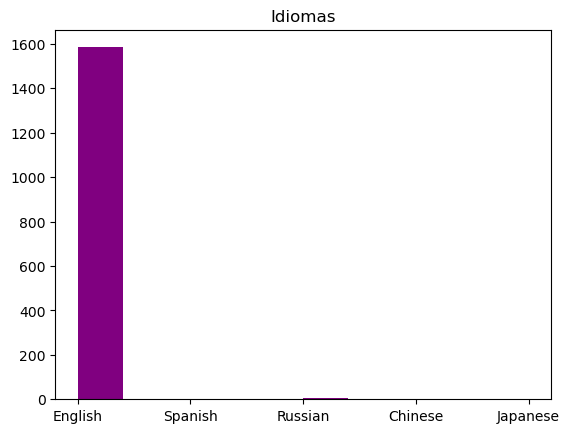

In [84]:
plt.hist(df['Language'], color='purple')
plt.title('Idiomas')
plt.show()

In [85]:
for i,arq in enumerate(arqs):
    
    if i == 0:
        df = pd.read_excel(f'../dados/{arq}')
        df = df.loc[df['Language'] == 'English']
    else:
        aux = pd.read_excel(f'../dados/{arq}')
        aux = aux.loc[aux['Language'] == 'English']
        df = pd.concat([df,aux])

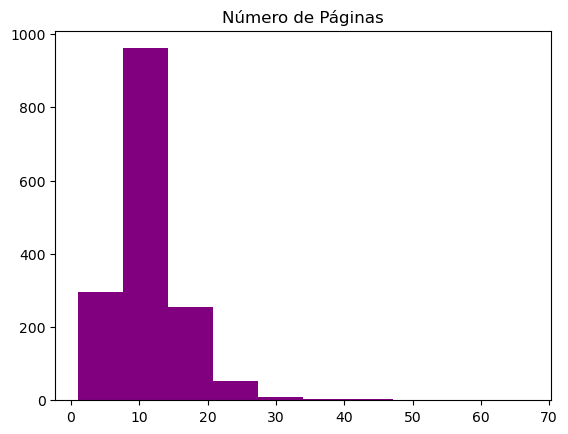

In [86]:
plt.hist(df['Number of Pages'], color='purple')
plt.title('Número de Páginas')
plt.show()

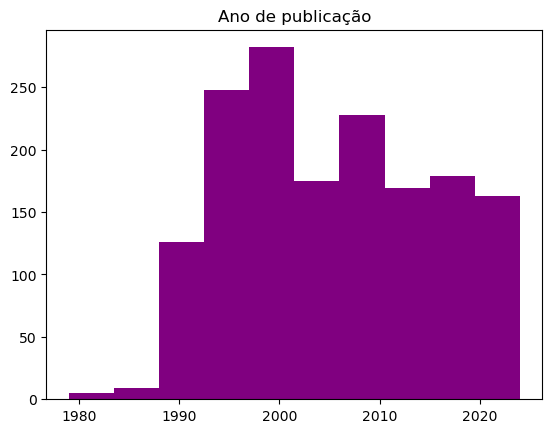

In [87]:
plt.hist(df['Publication Year'], color='purple')
plt.title('Ano de publicação')
plt.show()

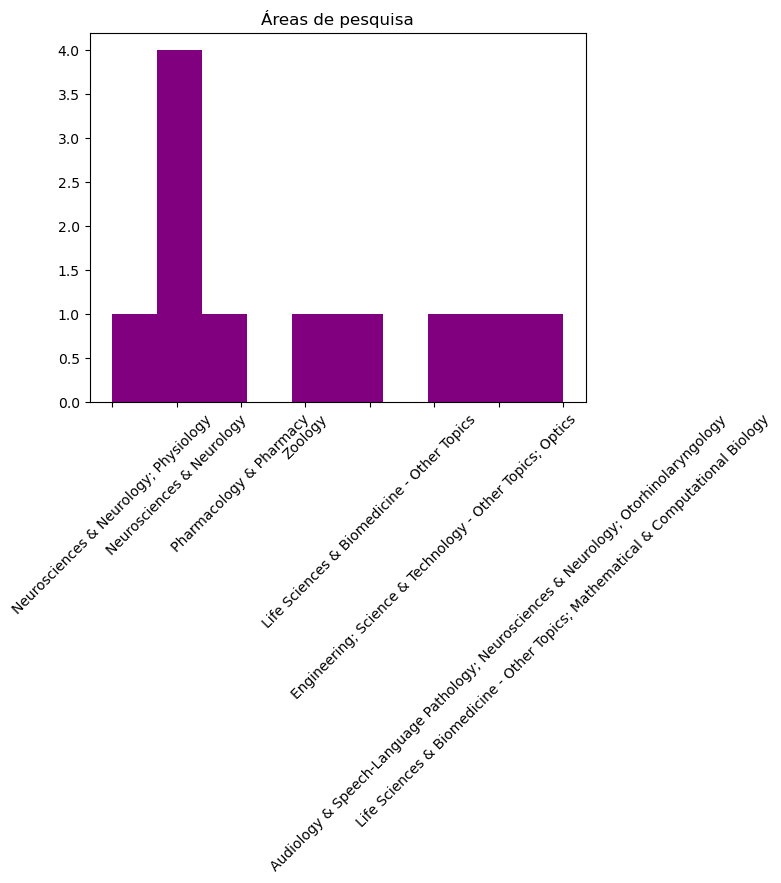

In [88]:
qtd = 11
plt.hist(df['Research Areas'][:qtd], color='purple')
plt.title('Áreas de pesquisa')
plt.xticks(rotation=45)
plt.show()

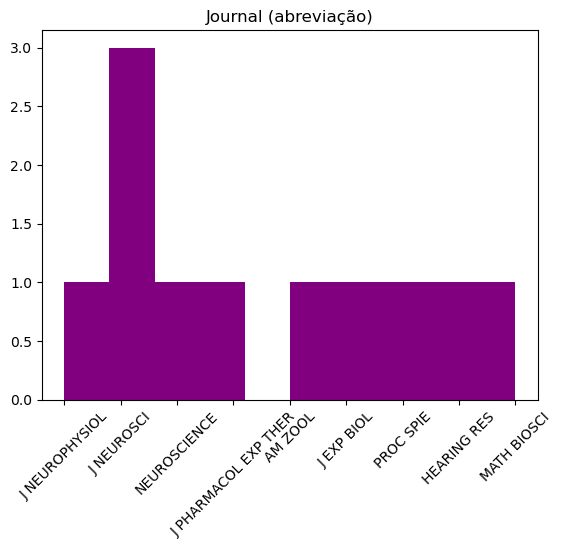

In [89]:
plt.hist(df['Journal Abbreviation'].astype(str)[:qtd], color='purple')
plt.title('Journal (abreviação)')
plt.xticks(rotation=45)
plt.show()

In [90]:
dic_key={}

for keywords in df['Keywords Plus']:
    if not isinstance(keywords,float):
        
        keywords = keywords.split(' ')
        
        for keyword in keywords:
            if ';' in keyword:
                keyword = keyword.replace(';','')
            
            keyword = keyword.lower()
            
            if keyword not in dic_key:
                dic_key[keyword] = 1
            else:
                dic_key[keyword] += 1

dic_key = dict(sorted(dic_key.items(), key=lambda item: item[1]))

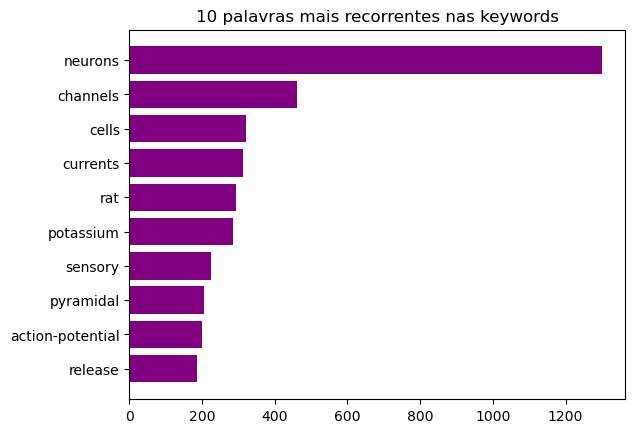

In [91]:
qtd = 10
plt.barh(list(dic_key.keys())[-qtd:],list(dic_key.values())[-qtd:],color='purple')
plt.title(f'{qtd} palavras mais recorrentes nas keywords')
plt.show()

#### Aula 2 - Extração dos valores em ms

In [92]:
import spacy
nlp = spacy.load('en_core_web_sm')

In [93]:
limite = 20
count = 0
lista_vals, abs_vals = [], []

for abs_index,abstract in enumerate(df['Abstract']):

    if not isinstance(abstract,float):
        if ' ms ' in abstract:
            
            doc = nlp(abstract)
            # doc = [t for t in doc if not t.is_stop]            
            
            ms_indexes = []
            for t in doc:
                if t.text=='ms':
                    ms_indexes.append(t.i)
                    count+=1
                    
            for ms_index in ms_indexes:
                doc_aux = doc[ms_index-20:ms_index+20]
                doc_aux = nlp(str(doc_aux))
                
                #print(doc_aux)
                for t in doc_aux:
                    if t.text=='ms':
                        check_index = 1
                        vals = []
                        while True:
                            if doc_aux[t.i-check_index].like_num:
                                vals.append(str(doc_aux[t.i-check_index]))
                                check_index+=1
                            elif str(doc_aux[t.i-check_index]) == '/-' or str(doc_aux[t.i-check_index]) == '+' or str(doc_aux[t.i-check_index]) == '-' or str(doc_aux[t.i-check_index]) == 'and' or str(doc_aux[t.i-check_index]) == 'to':
                                vals.append(str(doc_aux[t.i-check_index]))
                                check_index+=1
                            else:
                                break
                        # print(vals[::-1])
                        if len(vals) != 0:
                            lista_vals.append(vals[::-1])
                            abs_vals.append([abs_index,vals[::-1],doc_aux])      
        
        if ' millisecond ' in abstract:
            
            doc = nlp(abstract)
            # doc = [t for t in doc if not t.is_stop]            
            
            ms_indexes = []
            for t in doc:
                if t.text=='millisecond':
                    ms_indexes.append(t.i)
                    count+=1
                    
            for ms_index in ms_indexes:
                doc_aux = doc[ms_index-20:ms_index+20]
                doc_aux = nlp(str(doc_aux))
                
                # print(doc_aux)
                for t in doc_aux:
                    if t.text=='millisecond':
                        check_index = 1
                        vals = []
                        while True:
                            if doc_aux[t.i-check_index].like_num:
                                vals.append(str(doc_aux[t.i-check_index]))
                                check_index+=1
                            elif str(doc_aux[t.i-check_index]) == '/-' or str(doc_aux[t.i-check_index]) == '+' or str(doc_aux[t.i-check_index]) == '-' or str(doc_aux[t.i-check_index]) == 'and' or str(doc_aux[t.i-check_index]) == 'to':
                                vals.append(str(doc_aux[t.i-check_index]))
                                check_index+=1
                            else:
                                break
                        # print(vals[::-1])
                        if len(vals) != 0:
                            lista_vals.append(vals[::-1])
                            abs_vals.append([abs_index,vals[::-1],doc_aux])
        
        if ' milliseconds ' in abstract:
            
            doc = nlp(abstract)
            # doc = [t for t in doc if not t.is_stop]            
            
            ms_indexes = []
            for t in doc:
                if t.text=='milliseconds':
                    ms_indexes.append(t.i)
                    count+=1
                    
            for ms_index in ms_indexes:
                doc_aux = doc[ms_index-20:ms_index+20]
                doc_aux = nlp(str(doc_aux))
                
                # print(doc_aux)
                for t in doc_aux:
                    if t.text=='milliseconds':
                        check_index = 1
                        vals = []
                        while True:
                            if doc_aux[t.i-check_index].like_num:
                                vals.append(str(doc_aux[t.i-check_index]))
                                check_index+=1
                            elif str(doc_aux[t.i-check_index]) == '/-' or str(doc_aux[t.i-check_index]) == '+' or str(doc_aux[t.i-check_index]) == '-' or str(doc_aux[t.i-check_index]) == 'and' or str(doc_aux[t.i-check_index]) == 'to':
                                vals.append(str(doc_aux[t.i-check_index]))
                                check_index+=1
                            else:
                                break
                        # print(vals[::-1])
                        if len(vals) != 0:
                            lista_vals.append(vals[::-1])
                            abs_vals.append([abs_index,vals[::-1],doc_aux])

In [94]:
abs_vals

[[10,
  ['hundred'],
  amplitude of about 100 mV. However, differently from the nerve cell, the action potential lasts a few hundred milliseconds before repolarization. Moreover, several types of K+ channel such as the classical inward rectifier K+ channel,],
 [25,
  ['100', '-', '120'],
  . In seven of ten type B cells tested, the spontaneous spikes developed plateau potentials of 100-120 ms duration in 10 mM TEA, which then became 7-9 s long in Ca2+-free medium],
 [25,
  ['to', '30', '-', '100'],
  , the spontaneous plateaux were 1.75-2 s long in TEA, and were reduced to 30-100 ms in Ca2+-free medium. TTX abolished the spontaneous spikes and plateaux. The delayed AHP was abolished],
 [28,
  ['100'],
  strength-duration time constant (tau(SD)); current/threshold relationship; threshold electrotonus to a 100 ms polarizing current; and recovery curves to a supramaximal stimulus. Results: Compound muscle action potential (CMAP],
 [28,
  ['0.50', '+', '/-', '0.03'],
  with membrane hyperp

In [95]:
inf,sup = [],[]

for val in lista_vals:
    if 'and' not in val and 'to' not in val:
        
        if '+' in val and '/-' in val:
            if val[0] != '+':
                # print(val[0],'+/-',val[-1])
                
                if ',' in val[0]:
                    val[0] = val[0].replace(',','.')
                
                if ',' in val[-1]:
                    val[-1] = val[-1].replace(',','.')
                    
                inf.append(round(float(val[0])-float(val[-1]),4))
                sup.append(round(float(val[0])+float(val[-1]),4))
                
                # print(f'inf {float(val[0])-float(val[-1])}')
                # print(f'sup {float(val[0])+float(val[-1])}')
            # print()
            
        # elif '-' in val:
            # print(val)

In [96]:
print('Contagem de ocorrências',count)

Contagem de ocorrências 366


In [97]:
word_count = {}
for abs_val in abs_vals:
    #sentence = abs_val[2]
    #print(sentence)

    sentence =[t for t in abs_val[2] if not t.is_stop]
    sentence =[t for t in sentence if not t.is_punct]
    sentence =[t for t in sentence if not t.like_num]

    for word in sentence:
        word = str(word)
        if word not in word_count.keys():
            #print(word_count.keys())
            word_count[word] = 1
        else:
            word_count[word] += 1

In [98]:
sorted_word_count = {k: v for k, v in sorted(word_count.items(), key=lambda item: item[1])}
list(sorted_word_count.keys())[-50:]

['firing',
 'depolarization',
 'durations',
 'frequency',
 'vs',
 'mV.',
 'pulses',
 'slow',
 'AHP',
 'spike',
 'induced',
 'EPSPs',
 'rise',
 'latency',
 'repolarization',
 'outward',
 'evoked',
 'decay',
 'currents',
 'p',
 'peak',
 'mean',
 'cells',
 'potentials',
 'vs.',
 'fast',
 'respectively',
 'decreased',
 'pulse',
 'reduced',
 'constant',
 'IR',
 'membrane',
 'P',
 'AP',
 'increased',
 'n',
 'depolarizing',
 'amplitude',
 '<',
 '=',
 'neurons',
 'mV',
 'action',
 'current',
 'potential',
 'duration',
 'time',
 '+',
 'ms']

In [99]:
cells_count = {}
for abs_val in abs_vals:
    #sentence = abs_val[2]
    #print(sentence)

    sentence =[t for t in abs_val[2] if not t.is_stop]
    sentence =[t for t in sentence if not t.is_punct]
    sentence =[t for t in sentence if not t.like_num]

    for word in sentence:
        #word = str(word)
        if str(word) == "cells":
            
            cell_type_i = sentence.index(word) - 1
            cell_type = sentence[cell_type_i]

            cell_type = str(cell_type)

            if cell_type not in cells_count.keys():
                #print(word_count.keys())
                cells_count[cell_type] = 1
            else:
                cells_count[cell_type] += 1

In [100]:
sorted_cells_count = {k: v for k, v in sorted(cells_count.items(), key=lambda item: item[1])}
list(sorted_cells_count.items())[-10:]

[('potential', 1),
 ('Octopus', 1),
 ('inhibition', 1),
 ('s', 2),
 ('cord', 2),
 ('pyramidal', 2),
 ('III', 2),
 ('basket', 3),
 ('bistratified', 4),
 ('spiking', 6)]

In [101]:
limite = 20
count = 0
lista_mV_vals, abs_mV_vals, abs_ms_mV = [], [], []

#print(abs_vals)
for abs in abs_vals:

    abs_index = abs[0]
    ms_val = abs[1]
    ms_sentence = abs[2]

    #for abs_index, ms_val, ms_sentence in zip(abs[0], abs[1], abs[2]):
        
    print(abs_index)
    abstract= list(df['Abstract'])[abs_index]
    #print(abstract)

    if not isinstance(abstract,float):
        if ' mV ' in abstract:
            
            doc = nlp(abstract)
            # doc = [t for t in doc if not t.is_stop]            
            
            mV_indexes = []
            for t in doc:
                if t.text=='mV':
                    mV_indexes.append(t.i)
                    count+=1
                    
            for mV_index in mV_indexes:
                doc_aux = doc[mV_index-20:mV_index+20]
                doc_aux = nlp(str(doc_aux))
                
                #print(doc_aux)
                for t in doc_aux:
                    if t.text=='mV':
                        check_index = 1
                        vals = []
                        while True:
                            if doc_aux[t.i-check_index].like_num:
                                vals.append(str(doc_aux[t.i-check_index]))
                                check_index+=1
                            elif str(doc_aux[t.i-check_index]) == '/-' or str(doc_aux[t.i-check_index]) == '+' or str(doc_aux[t.i-check_index]) == '-' or str(doc_aux[t.i-check_index]) == 'and' or str(doc_aux[t.i-check_index]) == 'to':
                                vals.append(str(doc_aux[t.i-check_index]))
                                check_index+=1
                            else:
                                break
                        # print(vals[::-1])
                        if len(vals) != 0:
                            lista_mV_vals.append(vals[::-1])
                            abs_mV_vals.append([abs_index,vals[::-1],doc_aux])
                            abs_ms_mV.append([abs_index, ms_val, vals[::-1]])      
        
        if ' millivolt ' in abstract:
            
            doc = nlp(abstract)
            # doc = [t for t in doc if not t.is_stop]            
            
            mV_indexes = []
            for t in doc:
                if t.text=='millivolt':
                    mV_indexes.append(t.i)
                    count+=1
                    
            for mV_index in mV_indexes:
                doc_aux = doc[mV_index-20:mV_index+20]
                doc_aux = nlp(str(doc_aux))
                
                # print(doc_aux)
                for t in doc_aux:
                    if t.text=='millivolt':
                        check_index = 1
                        vals = []
                        while True:
                            if doc_aux[t.i-check_index].like_num:
                                vals.append(str(doc_aux[t.i-check_index]))
                                check_index+=1
                            elif str(doc_aux[t.i-check_index]) == '/-' or str(doc_aux[t.i-check_index]) == '+' or str(doc_aux[t.i-check_index]) == '-' or str(doc_aux[t.i-check_index]) == 'and' or str(doc_aux[t.i-check_index]) == 'to':
                                vals.append(str(doc_aux[t.i-check_index]))
                                check_index+=1
                            else:
                                break
                        # print(vals[::-1])
                        if len(vals) != 0:
                            lista_mV_vals.append(vals[::-1])
                            abs_mV_vals.append([abs_mV_index,vals[::-1],doc_aux])
                            abs_ms_mV.append([abs_index, ms_val, vals[::-1]]) 
        
        if ' millivolts ' in abstract:
            
            doc = nlp(abstract)
            # doc = [t for t in doc if not t.is_stop]            
            
            mV_indexes = []
            for t in doc:
                if t.text=='millivolts':
                    mV_indexes.append(t.i)
                    count+=1
                    
            for mV_index in mV_indexes:
                doc_aux = doc[mV_index-20:mV_index+20]
                doc_aux = nlp(str(doc_aux))
                
                # print(doc_aux)
                for t in doc_aux:
                    if t.text=='millivolts':
                        check_index = 1
                        vals = []
                        while True:
                            if doc_aux[t.i-check_index].like_num:
                                vals.append(str(doc_aux[t.i-check_index]))
                                check_index+=1
                            elif str(doc_aux[t.i-check_index]) == '/-' or str(doc_aux[t.i-check_index]) == '+' or str(doc_aux[t.i-check_index]) == '-' or str(doc_aux[t.i-check_index]) == 'and' or str(doc_aux[t.i-check_index]) == 'to':
                                vals.append(str(doc_aux[t.i-check_index]))
                                check_index+=1
                            else:
                                break
                        # print(vals[::-1])
                        if len(vals) != 0:
                            lista_mV_vals.append(vals[::-1])
                            abs_mV_vals.append([abs_mV_index,vals[::-1],doc_aux])
                            abs_ms_mV.append([abs_index, ms_val, vals[::-1]]) 

10
25
25
28
28
28
28
28
44
44
44
44
44
45
51
53
55
62
62
85
97
97
97
103
108
108
108
108
108
108
113
113
113
114
124
126
126
155
155
155
155
172
172
172
172
220
220
220
220
220
220
220
220
220
220
220
220
220
220
220
220
222
227
227
284
284
284
284
284
284
284
287
287
290
296
296
302
305
305
305
305
326
326
326
326
333
341
341
341
341
344
344
344
344
344
344
344
344
344
344
344
344
344
344
344
355
355
355
355
355
355
356
356
356
356
363
368
368
368
368
368
368
376
376
376
376
376
376
376
376
376
376
376
376
376
376
376
376
376
376
376
376
376
376
376
385
393
393
393
393
393
393
411
411
419
419
419
419
419
419
436
438
438
478
481
481
481
481
481
497
497
497
497
497
534
537
537
537
537
537
543
543
543
543
549
550
550
550
550
550
550
552
552
552
552
552
562
562
562
562
562
562
562
562
562
562
604
604
604
604
607
615
615
615
615
620
620
620
620
624
624
624
624
624
631
631
647
647
647
647
647
647
647
647
647
647
647
647
647
647
647
647
647
647
647
647
647
647
652
652
652
652
652
666
666
666

In [102]:
len(abs_vals)

503

In [103]:
len(abs_mV_vals)

1005

In [104]:
abs_ms_mV

[[44, ['9.8', '+', '/-', '4.5'], ['-69.2', '+', '/-', '4.6']],
 [44, ['9.8', '+', '/-', '4.5'], ['13.5', '+', '/-', '6.7']],
 [44,
  ['1.9', '+', '/-', '0.5', 'and', '10.7', '+', '/-', '5.6'],
  ['-69.2', '+', '/-', '4.6']],
 [44,
  ['1.9', '+', '/-', '0.5', 'and', '10.7', '+', '/-', '5.6'],
  ['13.5', '+', '/-', '6.7']],
 [44,
  ['to', '3.3', '+', '/-', '1.3', 'and', '20.1', '+', '/-', '9.7'],
  ['-69.2', '+', '/-', '4.6']],
 [44,
  ['to', '3.3', '+', '/-', '1.3', 'and', '20.1', '+', '/-', '9.7'],
  ['13.5', '+', '/-', '6.7']],
 [44,
  ['/-', '0.5', 'and', '10.7', '+', '/-', '5.6'],
  ['-69.2', '+', '/-', '4.6']],
 [44,
  ['/-', '0.5', 'and', '10.7', '+', '/-', '5.6'],
  ['13.5', '+', '/-', '6.7']],
 [44,
  ['to', '3.3', '+', '/-', '1.3', 'and', '20.1', '+', '/-', '9.7'],
  ['-69.2', '+', '/-', '4.6']],
 [44,
  ['to', '3.3', '+', '/-', '1.3', 'and', '20.1', '+', '/-', '9.7'],
  ['13.5', '+', '/-', '6.7']],
 [114, ['40', '+', '17.6'], ['-68', '+', '/-', '4']],
 [114, ['40', '+', '17.6'

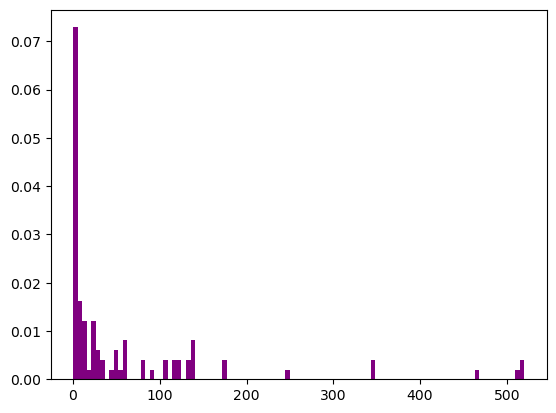

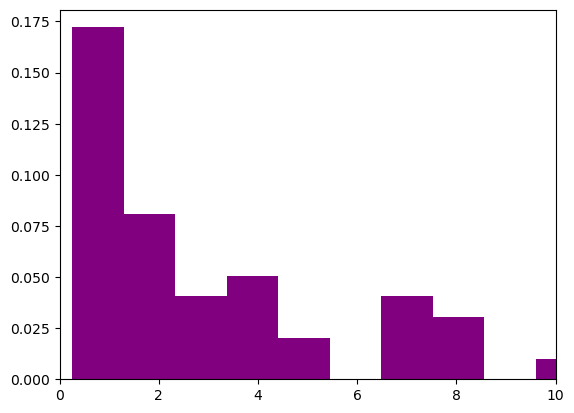

In [105]:
plt.hist(inf,bins=100,density=True, color="purple")
plt.show()
plt.hist(inf,bins=500,density=True, color="purple")
plt.xlim(0,10)
plt.show()

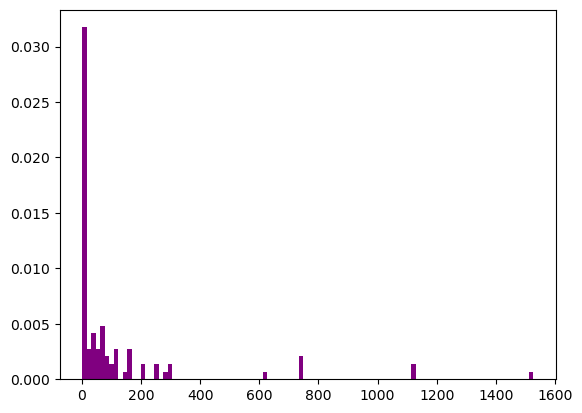

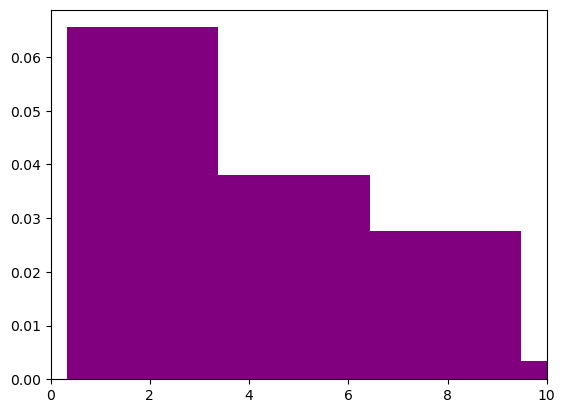

In [106]:
plt.hist(sup,bins=100,density=True, color="purple")
plt.show()
plt.hist(sup,bins=500,density=True, color="purple")
plt.xlim(0,10)
plt.show()

In [107]:
for abstract in random.sample(list(df['Abstract'].copy()), 3):
    doc = nlp(abstract)
    displacy.render(doc, style='dep', jupyter=True)

In [108]:
for abstract in random.sample(list(df['Abstract'].copy()), 3):
    if not isinstance(abstract,float):
        if ' ms ' in abstract:

            doc = nlp(abstract)

            ms_indexes = []
            for t in doc:
                if t.text=='ms':
                    ms_indexes.append(t.i)
                    count+=1
                    
            for ms_index in ms_indexes:
                doc_aux = doc[ms_index-5:ms_index+5]
                doc_aux = nlp(str(doc_aux))
                displacy.render(doc_aux, style='dep', jupyter=True)

        
        if ' milissecond ' in abstract:

            doc = nlp(abstract)

            ms_indexes = []
            for t in doc:
                if t.text=='ms':
                    ms_indexes.append(t.i)
                    count+=1
                    
            for ms_index in ms_indexes:
                doc_aux = doc[ms_index-5:ms_index+5]
                doc_aux = nlp(str(doc_aux))
                displacy.render(doc_aux, style='dep', jupyter=True)


#### Aula 3 - REGEX: Regular Expressions

#### Aula 4 - Basic Bag of Words

Selecionando um abstract aleatório do dataset e criando um *corpus* composto por cada uma de suas sentenças, temos:

In [109]:
corpus = list(df['Abstract'].copy())

#for abstract in random.sample(list(df['Abstract'].copy()),1):
    #if not isinstance(abstract,float):
      #print(abstract)
      #for sentence in abstract:
      # A corpus of sentences.
      #corpus = abstract.split('.')
      #corpus = sentences.copy()

#print(corpus)

#value = 0
print(len(corpus))

for abstract in corpus:
  if not isinstance(abstract, str):
  # if abstract == np.nan:
    
    # print(type(abstract))
    corpus.remove(abstract)
    #value +=1
    #print(abstract)

print(len(corpus))

#print(value)

1584
1561


Estabelecendo scikit-learn CountVectorizer, que pega uma coleção de textos de documentos e cria uma matriz de contagem de tokes:

In [110]:
vectorizer = CountVectorizer()

Introduzindo o método *fit_transform* que:
1. Aprende um dicionário do vabulário presente no corpus;
2. Returna uma matriz em que cada linha representa um documento e cada coluna representa um token (por exemplo, um termo).

OBS: 

- foi gerada uma matriz esparsa usando uma representação eficiente e comprimida, que permite diversos métodos úteis.

- se olharmos para a estrutura *raw*, veremos tuplas, em que o primeiro elemento representa o documento e o segundo representa o token ID. Então, ela é seguida pela contagem daquele token.

In [111]:
for abst in corpus:
    if not isinstance(abst,str):
    # print("True")
        print(type(abst))
        corpus.remove(abst)

<class 'float'>
<class 'float'>
<class 'float'>
<class 'float'>
<class 'float'>
<class 'float'>


In [112]:
bow = vectorizer.fit_transform(corpus)
print(bow)
print(type(bow))

  (0, 13688)	31
  (0, 9249)	1
  (0, 11597)	1
  (0, 10535)	1
  (0, 3187)	1
  (0, 6511)	1
  (0, 12114)	5
  (0, 13128)	1
  (0, 7086)	2
  (0, 13451)	3
  (0, 5810)	1
  (0, 7823)	1
  (0, 11314)	9
  (0, 8099)	5
  (0, 9236)	4
  (0, 13838)	8
  (0, 4236)	1
  (0, 10219)	5
  (0, 9243)	3
  (0, 6918)	7
  (0, 9166)	2
  (0, 9665)	11
  (0, 13100)	1
  (0, 5895)	1
  (0, 13074)	1
  :	:
  (1554, 4402)	1
  (1554, 5176)	1
  (1554, 6900)	1
  (1554, 2084)	1
  (1554, 5309)	1
  (1554, 1305)	1
  (1554, 1152)	3
  (1554, 256)	1
  (1554, 11055)	1
  (1554, 1285)	1
  (1554, 9329)	1
  (1554, 4067)	1
  (1554, 1202)	1
  (1554, 5312)	1
  (1554, 4297)	1
  (1554, 9997)	1
  (1554, 13308)	1
  (1554, 13781)	2
  (1554, 6683)	7
  (1554, 9094)	1
  (1554, 14754)	1
  (1554, 14753)	1
  (1554, 7980)	1
  (1554, 11654)	1
  (1554, 13768)	1
<class 'scipy.sparse._csr.csr_matrix'>


Olhando as features e o dicionário do vocaburário, temos:

(E também podemos observar que **CountVectorizer** cuidou da tokenização e também removeu a pontuação e colocou tudo em letra minúscula).

In [113]:
# View features (tokens).
print(vectorizer.get_feature_names_out())

# View vocabulary dictionary.
vectorizer.vocabulary_

['00' '000' '0001' ... 'zoster' 'zucapsaicin' 'zucker']


{'the': 13688,
 'neuropeptide': 9249,
 'red': 11597,
 'pigment': 10535,
 'concentrating': 3187,
 'hormone': 6511,
 'rpch': 12114,
 'strengthened': 13128,
 'inhibitory': 7086,
 'synapse': 13451,
 'from': 5810,
 'lateral': 7823,
 'pyloric': 11314,
 'lp': 8099,
 'neuron': 9236,
 'to': 13838,
 'dilator': 4236,
 'pd': 10219,
 'neurons': 9243,
 'in': 6918,
 'network': 9166,
 'of': 9665,
 'stomatogastric': 13100,
 'ganglion': 5895,
 'stg': 13074,
 'lobster': 8032,
 'homarus': 6486,
 'americanus': 1347,
 'produced': 11042,
 'several': 12488,
 'fold': 5713,
 'increases': 6964,
 'amplitude': 1399,
 'both': 2281,
 'action': 1011,
 'potential': 10816,
 'mediated': 8395,
 'and': 1449,
 'non': 9408,
 'impulse': 6914,
 'transmission': 13997,
 'that': 13685,
 'persisted': 10362,
 'for': 5729,
 'as': 1721,
 'long': 8065,
 'peptide': 10272,
 'remained': 11728,
 'present': 10946,
 'because': 2055,
 'is': 7455,
 'only': 9725,
 'feedback': 5503,
 'pacemaker': 10029,
 'kernel': 7634,
 'which': 14793,
 'cons

Callback: spaCy tokenize e filter tokens

In [114]:
# As usual, we start by importing spaCy and loading a statistical model.
nlp = spacy.load('en_core_web_sm')

# Create a tokenizer callback using spaCy under the hood. Here, we tokenize
# the passed-in text and return the tokens, filtering out punctuation.
def spacy_tokenizer(doc):
  return [t.text for t in nlp(doc) if not t.is_punct]

Instancia **CountVectorizer** com o tokenizer personalizado (spacy_tokenizer), desativa case-folding, e ativa o parâmetro *binary*. Assim, temos apenas 0s e 1s marcando a presença de um token ao invés da frequência do token.

In [115]:
vectorizer = CountVectorizer(tokenizer=spacy_tokenizer, lowercase=False, binary=True)
bow = vectorizer.fit_transform(corpus)
print(bow)

  (0, 7297)	1
  (0, 14779)	1
  (0, 16778)	1
  (0, 15842)	1
  (0, 9717)	1
  (0, 12488)	1
  (0, 6449)	1
  (0, 18009)	1
  (0, 18540)	1
  (0, 12968)	1
  (0, 18313)	1
  (0, 11973)	1
  (0, 13538)	1
  (0, 16522)	1
  (0, 4957)	1
  (0, 14766)	1
  (0, 18670)	1
  (0, 10655)	1
  (0, 5970)	1
  (0, 14772)	1
  (0, 12803)	1
  (0, 14700)	1
  (0, 15089)	1
  (0, 17984)	1
  (0, 12047)	1
  :	:
  (1554, 12785)	1
  (1554, 8792)	1
  (1554, 11555)	1
  (1554, 8150)	1
  (1554, 7985)	1
  (1554, 867)	1
  (1554, 16308)	1
  (1554, 8101)	1
  (1554, 2243)	1
  (1554, 14837)	1
  (1554, 10501)	1
  (1554, 8028)	1
  (1554, 11558)	1
  (1554, 10711)	1
  (1554, 5904)	1
  (1554, 18180)	1
  (1554, 7325)	1
  (1554, 18629)	1
  (1554, 12619)	1
  (1554, 14645)	1
  (1554, 19443)	1
  (1554, 19442)	1
  (1554, 13665)	1
  (1554, 16835)	1
  (1554, 18618)	1


Para confirmar, podemos tirar o filtro de pontuação do nosso tokenizer e rerun o nosso código.

In [116]:
print(vectorizer.get_feature_names_out())
vectorizer.vocabulary_

[' ' "'s" '+' ... 'zoster' 'zucapsaicin' '∼0.3']


{'The': 7297,
 'neuropeptide': 14779,
 'red': 16778,
 'pigment': 15842,
 'concentrating': 9717,
 'hormone': 12488,
 'RPCH': 6449,
 'strengthened': 18009,
 'the': 18540,
 'inhibitory': 12968,
 'synapse': 18313,
 'from': 11973,
 'lateral': 13538,
 'pyloric': 16522,
 'LP': 4957,
 'neuron': 14766,
 'to': 18670,
 'dilator': 10655,
 'PD': 5970,
 'neurons': 14772,
 'in': 12803,
 'network': 14700,
 'of': 15089,
 'stomatogastric': 17984,
 'ganglion': 12047,
 'STG': 6813,
 'lobster': 13704,
 'Homarus': 4260,
 'americanus': 8185,
 'produced': 16295,
 'several': 17495,
 'fold': 11893,
 'increases': 12848,
 'amplitude': 8238,
 'both': 8967,
 'action': 7865,
 'potential': 16080,
 'mediated': 14034,
 'and': 8286,
 'non': 14887,
 'impulse': 12799,
 'transmission': 18820,
 'that': 18537,
 'persisted': 15700,
 'for': 11908,
 'as': 8512,
 'long': 13736,
 'peptide': 15612,
 'remained': 16906,
 'present': 16204,
 'Because': 2550,
 'is': 13304,
 'only': 15145,
 'feedback': 11734,
 'pacemaker': 15419,
 'kern

Para termos uma representação densa em forma de array da nossa matriz esparsa, usamos *toarray*.

Além disso, também podemos indezar e fatiar a nossa matriz esparsa.

In [117]:
print('A dense representation like we saw in the slides.')
print(bow.toarray())
print()
print('Indexing and slicing.')
print(bow[0])
print()
print(bow[0:2])

A dense representation like we saw in the slides.
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 1 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 1 ... 0 0 0]]

Indexing and slicing.
  (0, 7297)	1
  (0, 14779)	1
  (0, 16778)	1
  (0, 15842)	1
  (0, 9717)	1
  (0, 12488)	1
  (0, 6449)	1
  (0, 18009)	1
  (0, 18540)	1
  (0, 12968)	1
  (0, 18313)	1
  (0, 11973)	1
  (0, 13538)	1
  (0, 16522)	1
  (0, 4957)	1
  (0, 14766)	1
  (0, 18670)	1
  (0, 10655)	1
  (0, 5970)	1
  (0, 14772)	1
  (0, 12803)	1
  (0, 14700)	1
  (0, 15089)	1
  (0, 17984)	1
  (0, 12047)	1
  :	:
  (0, 11434)	1
  (0, 15736)	1
  (0, 17012)	1
  (0, 15739)	1
  (0, 18975)	1
  (0, 7874)	1
  (0, 7322)	1
  (0, 10909)	1
  (0, 11021)	1
  (0, 15136)	1
  (0, 18317)	1
  (0, 13690)	1
  (0, 17196)	1
  (0, 14333)	1
  (0, 19034)	1
  (0, 15166)	1
  (0, 9749)	1
  (0, 9070)	1
  (0, 13984)	1
  (0, 12354)	1
  (0, 17885)	1
  (0, 18706)	1
  (0, 17681)	1
  (0, 15211)	1
  (0, 11703)	1

  (0, 7297)	1
  (0, 14779)	1
  (0, 16778)	1
  (0, 15842)	1


##### Cosine Similarity

In [118]:
# The cosine method expects array_like inputs, so we need to generate
# arrays from our sparse matrix.
for iabstract in range(1, bow.shape[0]):
    doc1_vs_docx = 1 - spatial.distance.cosine(bow[0].toarray()[0], bow[iabstract].toarray()[0])
    print(f'Doc1 vs Doc{iabstract}: {doc1_vs_docx}')

#doc1_vs_doc2 = 1 - spatial.distance.cosine(bow[0].toarray()[0], bow[1].toarray()[0])
#doc1_vs_doc3 = 1 - spatial.distance.cosine(bow[0].toarray()[0], bow[2].toarray()[0])
#doc1_vs_doc4 = 1 - spatial.distance.cosine(bow[0].toarray()[0], bow[3].toarray()[0])


#print(f"Doc 1 vs Doc 2: {doc1_vs_doc2}")
#print(f"Doc 1 vs Doc 3: {doc1_vs_doc3}")
#print(f"Doc 1 vs Doc 4: {doc1_vs_doc4}")

Doc1 vs Doc1: 0.22729080867562257
Doc1 vs Doc2: 0.1766425775872984
Doc1 vs Doc3: 0.25522704611859326
Doc1 vs Doc4: 0.22224365879413555
Doc1 vs Doc5: 0.15579890683407327
Doc1 vs Doc6: 0.19779694303230888
Doc1 vs Doc7: 0.21477533683602146
Doc1 vs Doc8: 0.1801705727313334
Doc1 vs Doc9: 0.166182672005859
Doc1 vs Doc10: 0.1686817997897525
Doc1 vs Doc11: 0.1441092013521108
Doc1 vs Doc12: 0.15710529278368746
Doc1 vs Doc13: 0.14634945902652985
Doc1 vs Doc14: 0.15788708322163758
Doc1 vs Doc15: 0.16382366899034917
Doc1 vs Doc16: 0.1901408450704225
Doc1 vs Doc17: 0.18502515391043872
Doc1 vs Doc18: 0.17016649066166567
Doc1 vs Doc19: 0.2213715709860472
Doc1 vs Doc20: 0.17602816676020272
Doc1 vs Doc21: 0.14584740108365146
Doc1 vs Doc22: 0.1767937479851729
Doc1 vs Doc23: 0.18471449687097197
Doc1 vs Doc24: 0.2130229601830057
Doc1 vs Doc25: 0.21917021219255095
Doc1 vs Doc26: 0.18840177664014512
Doc1 vs Doc27: 0.16282510020266105
Doc1 vs Doc28: 0.19721634123910814
Doc1 vs Doc29: 0.23066889195376983
Doc1

In [119]:
# cosine_similarity can take either array-likes or sparse matrices.
print(cosine_similarity(bow))

[[1.         0.22729081 0.17664258 ... 0.23053732 0.20624525 0.18344146]
 [0.22729081 1.         0.19923518 ... 0.21211184 0.22188754 0.21733114]
 [0.17664258 0.19923518 1.         ... 0.16809954 0.24429473 0.24460972]
 ...
 [0.23053732 0.21211184 0.16809954 ... 1.         0.19888747 0.23596995]
 [0.20624525 0.22188754 0.24429473 ... 0.19888747 1.         0.21613175]
 [0.18344146 0.21733114 0.24460972 ... 0.23596995 0.21613175 1.        ]]


<AxesSubplot:>

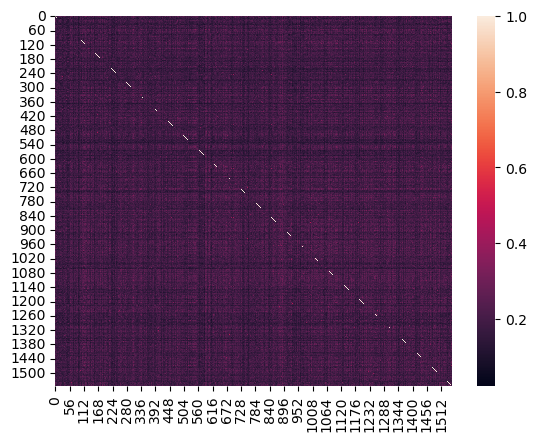

In [120]:
import seaborn as sns

sns.heatmap(cosine_similarity(bow))

In [121]:
vectorizer = CountVectorizer(tokenizer=spacy_tokenizer, lowercase=False, binary=True, ngram_range=(1,2))
bigrams = vectorizer.fit_transform(corpus)
print(vectorizer.get_feature_names_out())
print('Number of features: {}'.format(len(vectorizer.get_feature_names_out())))
print(vectorizer.vocabulary_)

[' ' '  controls' "'s" ... 'zucapsaicin the' '∼0.3' '∼0.3 msec']
Number of features: 185517
{'The': 36557, 'neuropeptide': 123420, 'red': 146327, 'pigment': 137012, 'concentrating': 68770, 'hormone': 97439, 'RPCH': 32819, 'strengthened': 159701, 'the': 165999, 'inhibitory': 104320, 'synapse': 162298, 'from': 92105, 'lateral': 110197, 'pyloric': 143497, 'LP': 26188, 'neuron': 121936, 'to': 172274, 'dilator': 78288, 'PD': 30871, 'neurons': 122518, 'in': 99924, 'network': 121443, 'of': 126330, 'stomatogastric': 159560, 'ganglion': 93722, 'STG': 34474, 'lobster': 111695, 'Homarus': 22085, 'americanus': 46877, 'produced': 141377, 'several': 153022, 'fold': 90222, 'increases': 102701, 'amplitude': 47126, 'both': 59361, 'action': 42476, 'potential': 138552, 'mediated': 115362, 'and': 48202, 'non': 124367, 'impulse': 99880, 'transmission': 175236, 'that': 164670, 'persisted': 136066, 'for': 90482, 'as': 54088, 'long': 111976, 'peptide': 135378, 'remained': 147853, 'present': 140300, 'Because':

In [122]:
# Setting n_gram range to (2, 2) generates only bigrams.
vectorizer = CountVectorizer(tokenizer=spacy_tokenizer, lowercase=False, binary=True, ngram_range=(2,2))
bigrams = vectorizer.fit_transform(corpus)
print(vectorizer.get_feature_names_out())
print(vectorizer.vocabulary_)

['  controls' "'s AP" "'s Action" ... 'zoster oticus' 'zucapsaicin the'
 '∼0.3 msec']
{'The neuropeptide': 29934, 'neuropeptide red': 108648, 'red pigment': 129554, 'pigment concentrating': 121170, 'concentrating hormone': 59053, 'hormone RPCH': 84954, 'RPCH strengthened': 26374, 'strengthened the': 141693, 'the inhibitory': 149419, 'inhibitory synapse': 91442, 'synapse from': 144010, 'from the': 80900, 'the lateral': 149566, 'lateral pyloric': 96690, 'pyloric LP': 126975, 'LP neuron': 21232, 'neuron to': 107386, 'to the': 155260, 'the pyloric': 150298, 'pyloric dilator': 126977, 'dilator PD': 67633, 'PD neurons': 24919, 'neurons in': 108310, 'in the': 88912, 'pyloric network': 126978, 'network of': 106795, 'of the': 114490, 'the stomatogastric': 150680, 'stomatogastric ganglion': 141576, 'ganglion STG': 81696, 'STG of': 27663, 'the lobster': 149609, 'lobster Homarus': 97991, 'Homarus americanus': 17825, 'americanus RPCH': 38693, 'RPCH produced': 26373, 'produced several': 125146, 'sev

##### TF-IDF

In [123]:
# Like before, if we want to use spaCy's tokenizer, we need
# to create a callback. Remember to upgrade spaCy if you need
# to (refer to beginnning of file for commentary and instructions).
nlp = spacy.load('en_core_web_sm')

# We don't need named-entity recognition nor dependency parsing for
# this so these components are disabled. This will speed up the
# pipeline. We do need part-of-speech tagging however.
unwanted_pipes = ["ner", "parser"]

# For this exercise, we'll remove punctuation and spaces (which
# includes newlines), filter for tokens consisting of alphabetic
# characters, and return the lemma (which require POS tagging).
def spacy_tokenizer(doc):
  with nlp.disable_pipes(*unwanted_pipes):
    return [t.lemma_ for t in nlp(doc) if \
            not t.is_punct and \
            not t.is_space and \
            t.is_alpha]

In [124]:
%%time
# Use the default settings of TfidfVectorizer.
vectorizer = TfidfVectorizer(tokenizer=spacy_tokenizer)
features = vectorizer.fit_transform(corpus)
print(features)

  (0, 3544)	0.023708927398754708
  (0, 7039)	0.015147081747595475
  (0, 9307)	0.023972482670481878
  (0, 10224)	0.11067254333976044
  (0, 9529)	0.053667921464396036
  (0, 4223)	0.04265085737819715
  (0, 5805)	0.01912741175850427
  (0, 1227)	0.017947168919113316
  (0, 1852)	0.027697595431812997
  (0, 7004)	0.07006358158945251
  (0, 10532)	0.02796941518446245
  (0, 6140)	0.030866228043563735
  (0, 8807)	0.023121970703433834
  (0, 5548)	0.033647137907192703
  (0, 6981)	0.01339979803354924
  (0, 2979)	0.016565204857504342
  (0, 2859)	0.048547105631030936
  (0, 10159)	0.026968591522134596
  (0, 135)	0.032597904398982205
  (0, 10467)	0.041989080500416984
  (0, 8622)	0.061678978815721756
  (0, 3361)	0.02234383140858819
  (0, 6815)	0.015215285234609298
  (0, 2796)	0.022195840169811312
  (0, 348)	0.018356026265218928
  :	:
  (1554, 741)	0.03698198956135893
  (1554, 2898)	0.011666266082180753
  (1554, 1614)	0.024228922521864208
  (1554, 10975)	0.05569628993611687
  (1554, 6900)	0.054393069137067

In [125]:
# The number of unique tokens.
print(len(vectorizer.get_feature_names_out()))

11098


In [126]:
# The dimensions of our feature matrix. X rows (documents) by Y columns (tokens).
print(features.shape)

(1555, 11098)


In [127]:
# What the encoding of the first document looks like in sparse format.
print(features[0])

  (0, 3544)	0.023708927398754708
  (0, 7039)	0.015147081747595475
  (0, 9307)	0.023972482670481878
  (0, 10224)	0.11067254333976044
  (0, 9529)	0.053667921464396036
  (0, 4223)	0.04265085737819715
  (0, 5805)	0.01912741175850427
  (0, 1227)	0.017947168919113316
  (0, 1852)	0.027697595431812997
  (0, 7004)	0.07006358158945251
  (0, 10532)	0.02796941518446245
  (0, 6140)	0.030866228043563735
  (0, 8807)	0.023121970703433834
  (0, 5548)	0.033647137907192703
  (0, 6981)	0.01339979803354924
  (0, 2979)	0.016565204857504342
  (0, 2859)	0.048547105631030936
  (0, 10159)	0.026968591522134596
  (0, 135)	0.032597904398982205
  (0, 10467)	0.041989080500416984
  (0, 8622)	0.061678978815721756
  (0, 3361)	0.02234383140858819
  (0, 6815)	0.015215285234609298
  (0, 2796)	0.022195840169811312
  (0, 348)	0.018356026265218928
  :	:
  (0, 5562)	0.06001062861023757
  (0, 9592)	0.06372087444361098
  (0, 3885)	0.02614152383921932
  (0, 9615)	0.05860005861024588
  (0, 6943)	0.10065651359628232
  (0, 6495)	0.

In [128]:
# Transform the query into a TF-IDF vector.
query = ["zucapsaicin"]
query_tfidf = vectorizer.transform(query)

In [129]:
# Calculate the cosine similarities between the query and each document.
# We're calling flatten() here becaue cosine_similarity returns a list
# of lists and we just want a single list.
cosine_similarities = cosine_similarity(features, query_tfidf).flatten()

In [130]:
import numpy as np

# numpy's argsort() method returns a list of *indices* that
# would sort an array:
# https://numpy.org/doc/stable/reference/generated/numpy.argsort.html
#
# The sort is ascending, but we want the largest k cosine_similarites
# at the bottom of the sort. So we negate k, and get the last k
# entries of the indices list in reverse order. There are faster
# ways to do this using things like argpartition but this is
# more succinct.
def top_k(arr, k):
  kth_largest = (k + 1) * -1
  return np.argsort(arr)[:kth_largest:-1]

In [131]:
# So for our query above, these are the top five documents.
top_related_indices = top_k(cosine_similarities, 5)
print(top_related_indices)

[1135 1554  510  512  513]


In [132]:
# Let's take a look at their respective cosine similarities.
print(cosine_similarities[top_related_indices])

[0.06735286 0.         0.         0.         0.        ]


In [133]:
len(corpus)

1555

In [134]:
# Top match.
print(corpus[top_related_indices[0]])

The cardiac electrophysiologic effects of civamide (zucapsaicin), the cis-isomer of the alkyl vanillylamide, capsaicin, were evaluated in intact dogs and isolated Purkinje fibers. In anesthetized dogs, the mechanism of ventricular tachycardia inducible from 1 to 3 h after coronary artery occlusion was determined by activation mapping. Of 16 dogs studied, nine had ventricular tachycardia of focal endocardial origin; four, a reentrant mechanism; and three had no inducible arrhythmia. Civamide (50 mu g/kg) was administered to 10 of 13 dogs that were inducible, but three dogs were used as time controls. Transmural activation times were unaltered by civamide, but mean arterial pressure decreased from 76 +/- 10 to 66 +/- 10 mm Hg (p < 0.05), and muscle refractory periods shortened from 138 +/- 3 to 132 +/- 4 ms (p < 0.05). Civamide altered inducibility in five of six dogs with ventricular tachycardia of focal endocardial origin, but those with epicardial reentrant mechanisms were not affecte

In [135]:
# Second-best match.
print(corpus[top_related_indices[1]])

Thyroid hormone deficiency during a critical period of development severely affects cognitive functions, re suiting in profound mental retardation Despite the importance of the disorder, the cellular mechanisms underlying these deficits remain largely unexplored The aim of this study was to examine the effects of the absence of thyroid hormone on the development of the intrinsic properties of CA1 hippocampal pyramidal cells These cells are known to exhibit different firing patterns during development, being classified as either regular spiking or burst spiking cells Patch clamp experiments showed that hypothyroid rats presented a larger number of regular spiking cells at early post natal age (P9-11) This difference in firing-pattern distribution disappeared at the pre-weanling age (P17-19), when almost every cell displayed bursting behavior in both control and hypothyroid rats However, when studied in detail, wean ling hypothyroid rats presented a smaller number of spikes per burst tha

In [136]:
# Try a different query
query = ["ion"]
query_tfidf = vectorizer.transform(query)

cosine_similarities = cosine_similarity(features, query_tfidf).flatten()
top_related_indices = top_k(cosine_similarities, 5)

print(top_related_indices)
print(cosine_similarities[top_related_indices])

[ 744 1144   77 1421  552]
[0.23922219 0.1857699  0.16605549 0.15484037 0.15099602]


In [137]:
print(corpus[top_related_indices[0]])

The role of the intracellular calcium ions on the bursting firing of action potentials in central snail neutrons elicited by d-amphetamine was studied in the identified RP4 neuron of the African snail, Achatina fulica Ferussac. Bursting activity of the potentials was elicited by d-amphetamine in central RP4 neuron of snail ii amphetamine was applied either extracellularly or intracellularly. The bursting firing of action potentials elicited by amphetamine was decreased following intracellular injection with either EGTA or magnesium ions or extracellular application of lanthanum ion. Intracellular injection of calcium ions elicited bursting activity of potentials in the RP4 neuron, however, intracellular injection of calcium ions did not prolong the duration of the bursting firing of action potentials elicited by amphetamine. W7 (N-(6-aminohexyl)-5-chloronayhtha lenesulfonamide hydrochloride), a calmodulin antagonist, dill not decrease the bursting firing of action potentials elicited b

In [138]:
print(corpus[top_related_indices[1]])

In in vitro experiments on isolated rat hippocampal neurons, we studied the electrophysiological mechanisms of the antiarrhythmic effects of N-deacetyllappaconitine monochlorhydrate (DALCh), active metabolite of lappaconitine hydrobromide (allapinin). Electrical activity of neurons was recorded by the patch-clamp method in the whole cell configuration. It was shown that DALCh increased the duration of both slow and fast depolarization phases and decreased the amplitude of the action potential. DALCh effectively inhibited transmembrane currents of Na+ ions and partially K+ ions through the corresponding transmembrane voltage-gated ion channels. Thus, DALCh, in contrast to lappaconitine hydrobromide, belongs not to 1C, but to the 1A class of antiarrhythmics according to the Vaughan-Williams classification.


Aula 5 - TF - IDF

Importando as bibliotecas necessárias

In [139]:
import numpy as np
from scipy.sparse import csr_matrix
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import TruncatedSVD
from sklearn.cluster import KMeans
from sklearn.pipeline import make_pipeline

import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

In [140]:
nltk.download('stopwords')
nltk.download('punkt')

stop_words = set(stopwords.words('english'))

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\monyque220063\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\monyque220063\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [141]:
abstracts = list()
for abst in df['Abstract']:
    if str(abst) != 'nan':
        abst = word_tokenize(abst)
        filtered_words = [word for word in abst if word.lower() not in stop_words]
        filtered_text = ' '.join(filtered_words)
        abstracts.append(str(filtered_text))

In [142]:
titles = list()
for tls,abst in zip(df['Article Title'],df['Abstract']):
    if str(abst) != 'nan':
        titles.append(str(tls))

In [143]:
tfidf = TfidfVectorizer()
matrix = tfidf.fit_transform(abstracts)
words = tfidf.get_feature_names_out()
print(matrix)

  (0, 5444)	0.026815200936463453
  (0, 12678)	0.028327558454713835
  (0, 12947)	0.06586786497766803
  (0, 6316)	0.046852336767609526
  (0, 8294)	0.020426437001260463
  (0, 3213)	0.031523746055279744
  (0, 9709)	0.06408620989549463
  (0, 8711)	0.033030113963519486
  (0, 12035)	0.02585773164112573
  (0, 7975)	0.0359322605385131
  (0, 4688)	0.020983892756674307
  (0, 4519)	0.0518441495005143
  (0, 13721)	0.028800145189256204
  (0, 1020)	0.0348117690456929
  (0, 14136)	0.0448407405252456
  (0, 10372)	0.04630930549107497
  (0, 11796)	0.0748219023822352
  (0, 5165)	0.04604870208913998
  (0, 1299)	0.019602663383521842
  (0, 99)	0.022663221789456792
  (0, 12578)	0.024548785567137875
  (0, 3217)	0.036593424127866314
  (0, 13717)	0.03980358177859766
  (0, 2739)	0.04835870467584927
  (0, 6983)	0.056530560864847715
  :	:
  (1554, 5410)	0.04562596133842228
  (1554, 7655)	0.03799033440629572
  (1554, 5578)	0.09253761101046168
  (1554, 4334)	0.05812889208048957
  (1554, 3584)	0.042315825574658565
  (

In [144]:
print(vectorizer.vocabulary_)

{'the': 10085, 'neuropeptide': 6570, 'red': 8458, 'pigment': 7625, 'concentrate': 1827, 'hormone': 4376, 'rpch': 8834, 'strengthen': 9635, 'inhibitory': 4834, 'synapse': 9895, 'from': 3817, 'lateral': 5403, 'pyloric': 8244, 'lp': 5611, 'neuron': 6558, 'to': 10206, 'dilator': 2629, 'pd': 7364, 'in': 4700, 'network': 6495, 'of': 6943, 'stomatogastric': 9615, 'ganglion': 3885, 'stg': 9592, 'lobster': 5562, 'homarus': 4351, 'americanus': 383, 'produce': 8028, 'several': 9130, 'fold': 3735, 'increase': 4737, 'amplitude': 426, 'both': 1131, 'action': 129, 'potential': 7851, 'mediate': 5859, 'and': 469, 'non': 6711, 'impulse': 4697, 'transmission': 10320, 'that': 10083, 'persist': 7483, 'for': 3747, 'as': 684, 'long': 5588, 'peptide': 7408, 'remain': 8548, 'present': 7958, 'because': 949, 'be': 940, 'only': 6989, 'feedback': 3572, 'pacemaker': 7206, 'kernel': 5277, 'which': 10983, 'consist': 1918, 'electrically': 3022, 'couple': 2089, 'two': 10455, 'anterior': 519, 'burster': 1219, 'ab': 6, '

In [145]:
df_tf_idf = pd.DataFrame(matrix.toarray(), columns = words)
df_tf_idf.T

,0,1,2,3,4,5,6,7,8,9,...,1545,1546,1547,1548,1549,1550,1551,1552,1553,1554
00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
0001,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
00011,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
0002,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
zone,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
zones,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
zoster,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
zucapsaicin,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [146]:
def TF_IDF_func_presrntation(Num):
    DF = df_tf_idf.T[Num].nlargest(10)
    print( 'Doc number ' , Num+1)
    print( 30*'-')
    return DF

In [173]:
print(TF_IDF_func_presrntation(234))


Doc number  235
------------------------------
muscular        0.474490
atrophy         0.439787
spinal          0.272851
axonal          0.242265
0005            0.238820
patients        0.202875
electrotonus    0.170174
ambulatory      0.128460
strength        0.110151
degeneration    0.103901
Name: 234, dtype: float64


In [148]:
svd = TruncatedSVD(n_components=10)
lsa = svd.fit_transform(matrix)

topic_encoded_df = pd.DataFrame(lsa, columns = ["topic_1", "topic_2", "topic_3", "topic_4", "topic_5", "topic_6", "topic_7", "topic_8", "topic_9", "topic_10"])
topic_encoded_df["titles"] = titles
display(topic_encoded_df[["titles", "topic_1", "topic_2", "topic_3", "topic_4", "topic_5", "topic_6", "topic_7", "topic_8", "topic_9", "topic_10"]])

,titles,topic_1,topic_2,topic_3,topic_4,topic_5,topic_6,topic_7,topic_8,topic_9,topic_10
0,Red pigment concentrating hormone strongly enh...,0.104655,-0.037555,-0.004073,0.045056,0.013366,-0.009850,0.039012,0.011266,-0.003209,-0.035157
1,Sustained activation of hippocampal Lp-type vo...,0.207244,0.051227,-0.037644,0.016200,0.130847,-0.152390,0.078600,-0.091450,0.029173,-0.044780
2,Decreased Spire2 Expression is Involved in Epi...,0.111222,-0.058841,-0.008184,0.027507,0.041401,-0.011591,-0.001171,-0.020960,-0.034066,0.027967
3,Inhibition of transient and persistent Na+ cur...,0.265180,0.019808,0.007955,-0.133932,-0.043311,0.045303,0.070978,-0.016874,-0.088801,0.032090
4,Serotonin directly increases a calcium current...,0.266776,0.113386,-0.021234,0.003941,0.051984,-0.003683,0.241054,0.198713,-0.043295,-0.082848
...,...,...,...,...,...,...,...,...,...,...,...
1550,Electrophysiological and morphological propert...,0.225389,-0.103736,-0.037716,-0.019080,-0.034460,-0.110640,-0.180843,0.075114,-0.050224,-0.099218
1551,Kv3 channels:: voltage-gated K+ channels desig...,0.201192,0.038658,-0.075614,-0.086923,0.139643,-0.189026,0.055062,-0.071055,0.085439,0.089546
1552,PROPERTIES AND IONIC BASIS OF THE ACTION-POTEN...,0.364682,0.209660,-0.099928,-0.004720,-0.140324,0.089096,-0.072692,-0.069411,0.092067,0.051848
1553,Treatment of myotonia congenita with retigabin...,0.134861,-0.050844,-0.018439,-0.008347,0.122490,0.056626,0.041220,-0.036950,-0.056340,0.013380


In [174]:
print(topic_encoded_df['titles'][0])

Red pigment concentrating hormone strongly enhances the strength of the feedback to the pyloric rhythm oscillator but has little effect on pyloric rhythm period


In [149]:
from sklearn.feature_extraction.text import CountVectorizer

encoding_matrix = pd.DataFrame(svd.components_,
                               index=["topic_1", "topic_2", "topic_3", "topic_4", "topic_5", "topic_6", "topic_7", "topic_8", "topic_9", "topic_10"],
                               columns=words).T
encoding_matrix

,topic_1,topic_2,topic_3,topic_4,topic_5,topic_6,topic_7,topic_8,topic_9,topic_10
00,0.000225,-0.000263,0.000394,-0.000038,-0.000562,0.000788,0.000344,-0.000068,0.001784,0.002204
000,0.002432,0.000335,-0.001148,0.000901,0.002006,0.005119,-0.002661,-0.000968,-0.001225,-0.002256
0001,0.002308,-0.007934,-0.002193,0.004757,0.017606,0.022863,0.001263,-0.010762,-0.018017,0.005933
00011,0.000310,-0.000339,-0.000023,-0.000957,0.000337,-0.000139,-0.000935,0.000272,-0.000322,0.000127
0002,0.000082,-0.000097,0.000102,0.000185,0.000174,0.000093,-0.000187,0.000044,-0.000207,0.000065
...,...,...,...,...,...,...,...,...,...,...
zone,0.002488,-0.003631,-0.001454,0.002177,-0.001822,0.000157,-0.001965,-0.002592,0.002147,-0.000349
zones,0.003458,-0.006448,-0.000727,0.006872,0.003388,-0.001090,-0.004813,0.000262,0.004682,0.008317
zoster,0.000134,-0.000723,0.000008,0.000667,0.001404,0.001855,0.000196,-0.000535,-0.000054,0.000024
zucapsaicin,0.000100,-0.000083,0.000257,-0.000130,0.000064,0.000354,0.000143,-0.000173,0.000263,0.000399


In [150]:
# Código James
import itertools


In [151]:
combs = list(itertools.combinations(["topic_1", "topic_2", "topic_3", "topic_4", "topic_5", "topic_6", "topic_7", "topic_8", "topic_9", "topic_10"],2))


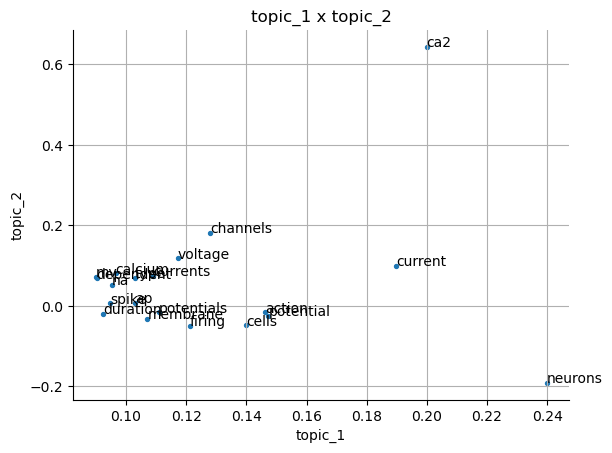

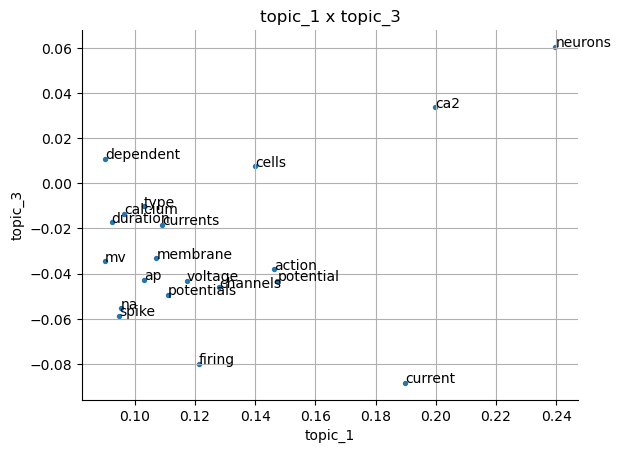

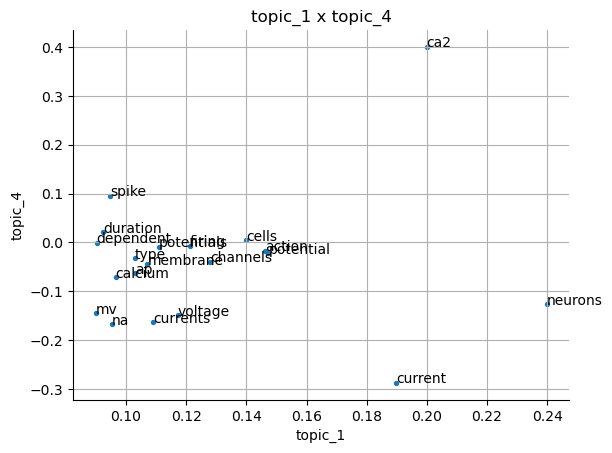

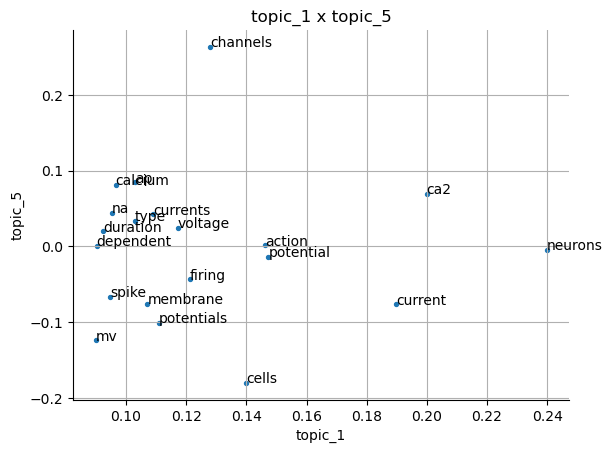

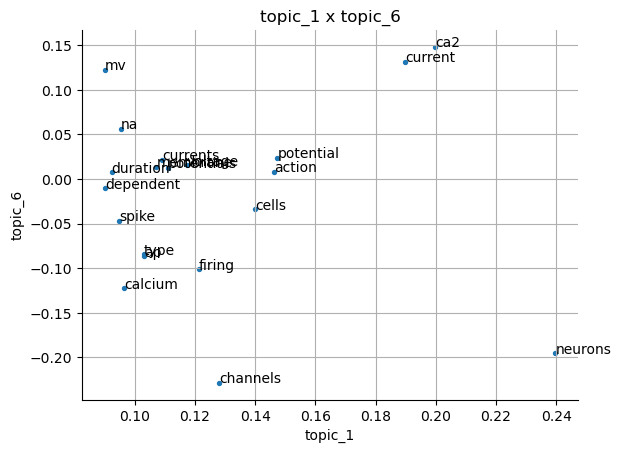

...

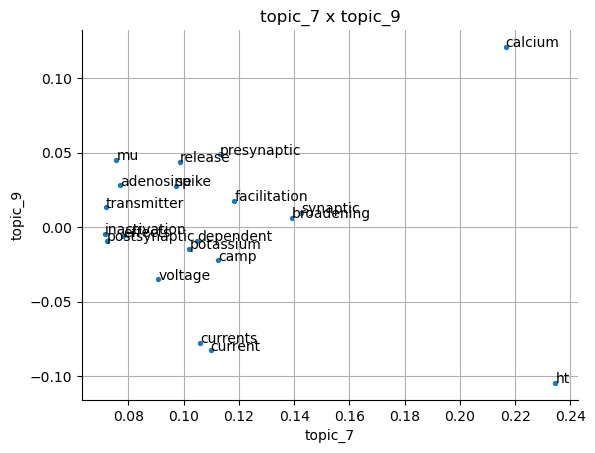

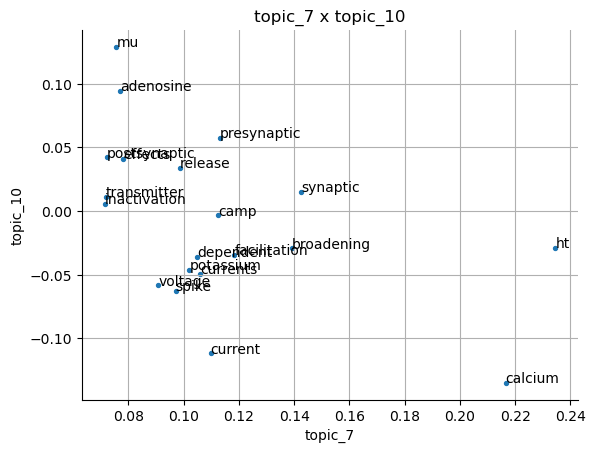

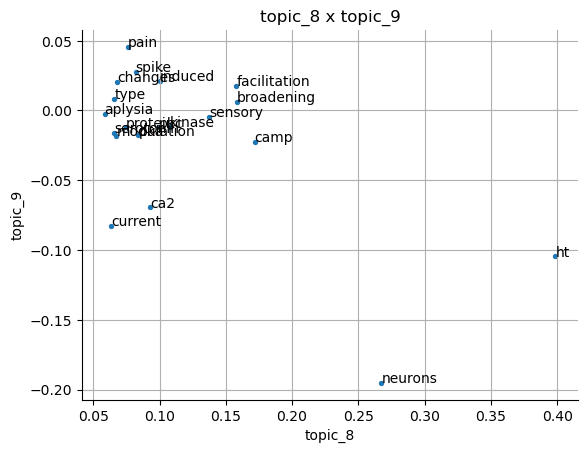

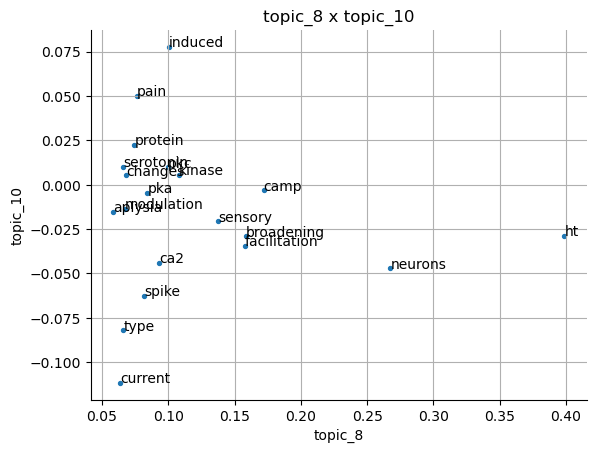

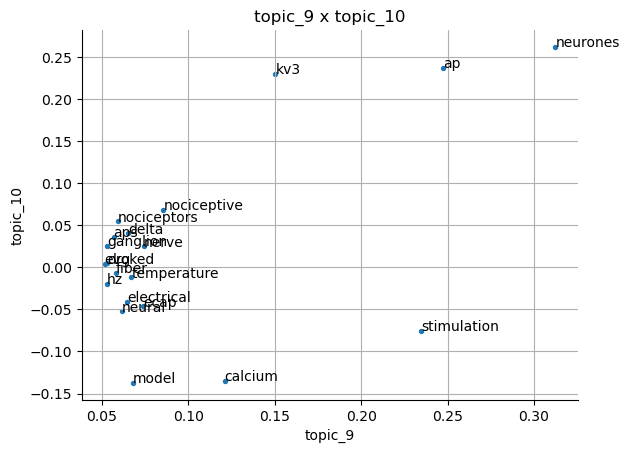

In [152]:
for comb in combs:
    
    fig, ax = plt.subplots()
    
    encoding_matrix_aux = encoding_matrix.sort_values(comb[0], ascending=False)
    enconding_matrix_aux = encoding_matrix_aux.iloc[:20]

    ax.scatter(list(encoding_matrix_aux[comb[0]])[:20], list(encoding_matrix_aux[comb[1]])[:20], s=8)
    
    for i, word in enumerate(enconding_matrix_aux.index):
        ax.annotate(word, (encoding_matrix_aux[comb[0]][i], encoding_matrix_aux[comb[1]][i]))
    
    ax.set_xlabel(comb[0])
    ax.set_ylabel(comb[1])
    ax.set_title(f'{comb[0]} x {comb[1]}')

    # plt.xlim(min(x_plot)-0.001,max(x_plot)+0.001)
    # plt.xlim(min(x_plot),max(x_plot))
    # plt.ylim(min(y_plot)-0.001,max(y_plot)+0.001)

    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)

    plt.grid()

    plt.show()


## Aula 6 - Classificação

In [153]:
# Importando as bibliotecas

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import spacy

from sklearn import metrics
from sklearn import model_selection
from sklearn.datasets import fetch_20newsgroups
from sklearn.dummy import DummyClassifier
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB
from sklearn.pipeline import Pipeline

In [154]:
# Convertendo os tópicos obtidos para a utilização do modelo baisiano
import pandas as pd

training_corpus = pd.read_excel('topics.xlsx').dropna()

In [155]:
print('Training data size: {}'.format(len(training_corpus)))

Training data size: 1555


In [156]:
# These are the labels/targets for each post.
print(training_corpus['labels'])

0       9
1       5
2       9
3       3
4       8
       ..
1550    0
1551    5
1552    2
1553    9
1554    1
Name: labels, Length: 1555, dtype: int64


In [157]:
# The first post along with its corresponding label.
print(training_corpus['abstract'][0])

first_doc_label = training_corpus['labels'][0]
print('Corresponding topic: {}'.format(training_corpus['labels'][first_doc_label]))

neuropeptide , red pigment concentrating hormone ( RPCH ) , strengthened inhibitory synapse lateral pyloric ( LP ) neuron pyloric dilator ( PD ) neurons pyloric network stomatogastric ganglion ( STG ) lobster , Homarus americanus . RPCH produced several-fold increases amplitude action potential - mediated non - impulse-mediated transmission persisted long peptide remained present . LP PD synapse feedback pacemaker kernel pyloric network , consists electrically coupled two PD neurons anterior burster ( AB ) neuron , might expected strengthening LP PD synapse would increase period pyloric rhythm . However , period pyloric rhythm increased transiently RPCH , transient increase cycle period observed even LP neuron hyperpolarized . Phase response curves measured using dynamic clamp create artificial inhibitory inputs variable strength duration PD neurons . Synaptic conductance values seen normal saline ineffective changing pyloric period throughout pyloric cycle . Conductances similar seen 

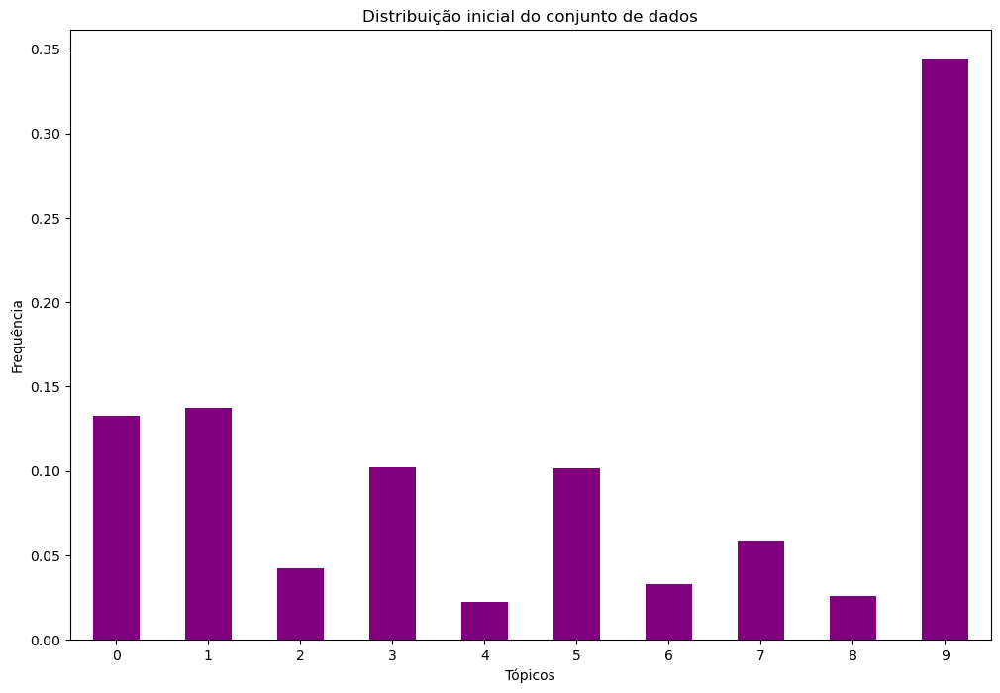

In [162]:

# Construção do conjunto de dados
bins, counts = np.unique(training_corpus['labels'], return_counts=True)
freq_series = pd.Series(counts/len(training_corpus['abstract']))
plt.figure(figsize=(12, 8))
ax = freq_series.plot(kind='bar', color='purple')
ax.set_xticklabels(bins, rotation=0)
ax.set_title("Distribuição inicial do conjunto de dados")

# Colocação das legendas
# Adicionando títulos aos eixos x e y
ax.set_xlabel('Tópicos')
ax.set_ylabel('Frequência')

plt.show()


Ok! Agora que entendemos melhor a distribuição dos nossos dados, vamos separar eles em treino e teste! Se nos temos um pequeno conjunto de dados, vamos usar o cross-validation. A biblioteca do sckit-learning é muito boa para executar isso.

In [163]:
# Shuffle, then split the data into train and validation sets. Set the random_state
# to 1 for reproducibility.
train_data, val_data, train_labels, val_labels = train_test_split(training_corpus['abstract'], training_corpus['labels'], train_size=0.8, random_state=1)
print('Training data size: {}'.format(len(train_data)))
print('Validation data size: {}'.format(len(val_data)))

Training data size: 1244
Validation data size: 311


Tendo o nosso espaço de treino e validação dos dados, vamos criar o nosso spaCy tokenizer.

In [164]:
nlp = spacy.load('en_core_web_sm')

In [165]:
nlp.pipe_names # Por padrão, ele vem com um pipeline de pré-processamento com vários componentes habilitados. Podemos visualizar esses componentes através do atributo *pipe_names*.

['tok2vec', 'tagger', 'parser', 'attribute_ruler', 'lemmatizer', 'ner']

Para nossa primeira tentativa de construção de um classificador Naive Bayes, tentaremos apenas a tokenização. Nada mais.

In [166]:
nlp = spacy.blank('en')

# There should be no pipeline components.
nlp.pipe_names

[]

In [167]:
# For this exercise, we'll remove punctuation and spaces (which
# includes newlines), filter for tokens consisting of alphabetic
# characters only, and return the token text.
nlp.Defaults.stop_words.add("nan")

def spacy_tokenizer(doc):
  return [t.text for t in nlp(doc) if \
          not t.is_punct and \
          not t.is_space]

Vamos usar o TFIDVECTORIZER!

In [168]:
%%time
vectorizer = TfidfVectorizer(tokenizer=spacy_tokenizer)
train_feature_vects = vectorizer.fit_transform(train_data)

Wall time: 1.63 s


In [ ]:
# Instantiate a classifier with the default settings.
nb_classifier = MultinomialNB()
nb_classifier.fit(train_feature_vects, train_labels)
nb_classifier.get_params()

Colocar o *fit* no classificador e passar a ele os vetores de recursos e os rótulos correspondentes de modo a iniciar o treinamento.

In [169]:
# Instantiate a classifier with the default settings.
nb_classifier = MultinomialNB()
nb_classifier.fit(train_feature_vects, train_labels)
nb_classifier.get_params()

{'alpha': 1.0, 'class_prior': None, 'fit_prior': True}

Agora que sabemos sobre a **pontuação F1** e temos um problema multiclasse, vamos dar uma olhada na pontuação F1 nos dados de treinamento. Como o conjunto de dados é balanceado, a precisão também pode funcionar aqui

In [170]:
# Get predictions on training set and calculate F1 score.
# See documentation above for more details on what "macro" means.
train_preds = nb_classifier.predict(train_feature_vects)
print('F1 score on initial training set: {}'.format(metrics.f1_score(train_labels, train_preds, average='macro')))

F1 score on initial training set: 0.22066123587328815


In [171]:
# Vectorize the validation data.
val_feature_vects = vectorizer.transform(val_data)

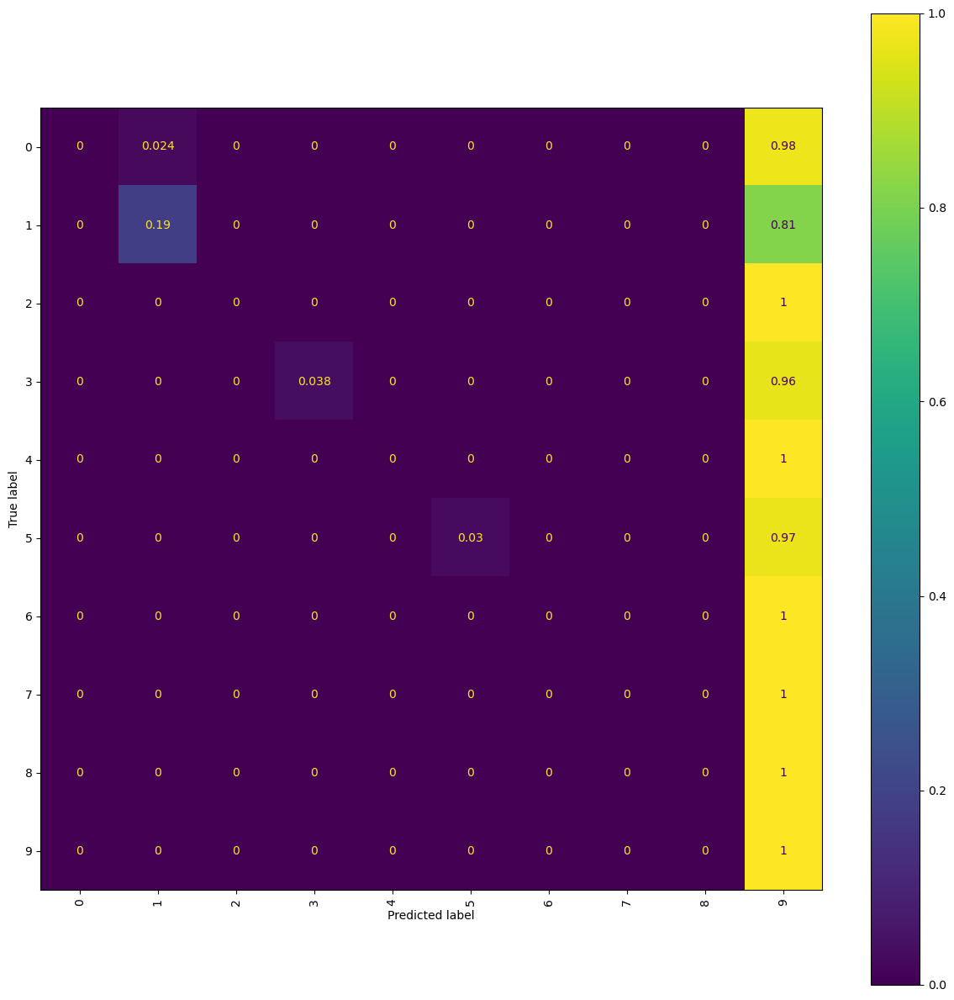

In [172]:
# Set the size of the plot.
fig, ax = plt.subplots(figsize=(15, 15))

# Create the confusion matrix.
disp = ConfusionMatrixDisplay.from_estimator(nb_classifier, val_feature_vects, val_labels, normalize='true', xticks_rotation='vertical', ax=ax)
# If you had an error, upgrade your scikit-learn package.
# pip uninstall scikit-learn
# pip install scikit-learn==1.0.2

In [176]:
# Predict and evaluate.
val_preds = nb_classifier.predict(val_feature_vects)
print('F1 score on filtered validation set: {}'.format(metrics.f1_score(val_labels, val_preds, average='macro')))

F1 score on filtered validation set: 0.09627573988628756


In [177]:
print(metrics.classification_report(val_labels, val_preds))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00        42
           1       0.89      0.19      0.31        43
           2       0.00      0.00      0.00        14
           3       1.00      0.04      0.07        26
           4       0.00      0.00      0.00         6
           5       1.00      0.03      0.06        33
           6       0.00      0.00      0.00         9
           7       0.00      0.00      0.00        21
           8       0.00      0.00      0.00        11
           9       0.35      1.00      0.52       106

    accuracy                           0.37       311
   macro avg       0.32      0.13      0.10       311
weighted avg       0.43      0.37      0.23       311



c:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Analisamos que os dados realmente não tiveram uma boa distribuição, o que podemos fazer diante disso? Vamos tentar ser melhores ao mudar as nossas estratégias. Uma coisa que provavelmente é um problema é o grande número de recursos que temos em relação à escassez de dados.


In [178]:
print('Training data size: {}'.format(len(train_data)))
print('Number of training features: {}'.format(len(train_feature_vects[0].toarray().flatten())))

Training data size: 1244
Number of training features: 14959


In [179]:
nlp = spacy.load('en_core_web_sm')

In [180]:
unwanted_pipes = ['ner', 'parser']

# Further remove stop words and take the lemma instead of token text.
def spacy_tokenizer(doc):
  with nlp.disable_pipes(*unwanted_pipes):
    return [t.lemma_ for t in nlp(doc) if \
            not t.is_punct and \
            not t.is_space and \
            not t.is_stop]

In [181]:
%%time
vectorizer = TfidfVectorizer(tokenizer=spacy_tokenizer)
train_feature_vects = vectorizer.fit_transform(train_data)

Wall time: 36.3 s


In [182]:
# Check the number of features now.
print('Number of training features: {}'.format(len(train_feature_vects[0].toarray().flatten())))

Number of training features: 12932


In [183]:
nb_classifier.fit(train_feature_vects, train_labels)
train_preds = nb_classifier.predict(train_feature_vects)
print('Training F1 score with fewer features: {}'.format(metrics.f1_score(train_labels, train_preds, average='macro')))

Training F1 score with fewer features: 0.20041715466002002


Vamos agora checar a perfomance do nosso classificador.

In [184]:
%%time
val_feature_vects = vectorizer.transform(val_data)

Wall time: 10 s


In [185]:
val_preds = nb_classifier.predict(val_feature_vects)
print('Validation F1 score with fewer features: {}'.format(metrics.f1_score(val_labels, val_preds, average='macro')))

Validation F1 score with fewer features: 0.1001218937324414


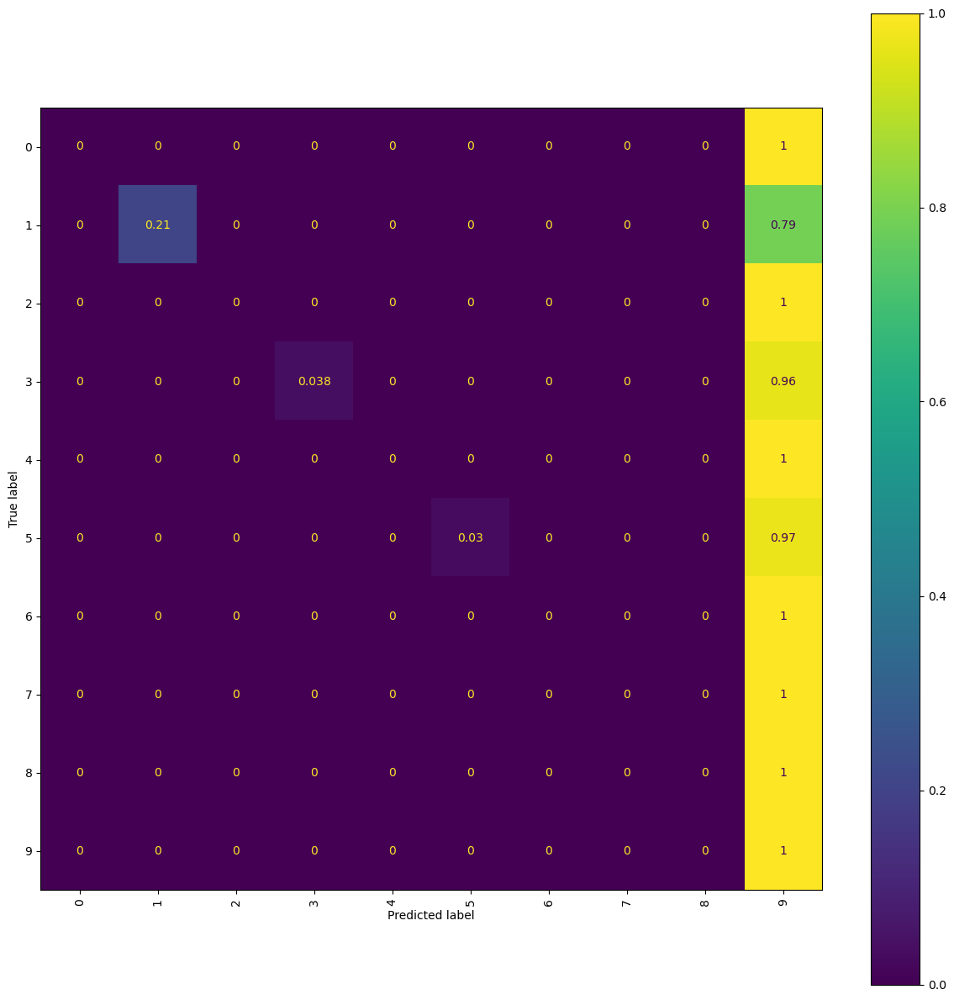

In [186]:
fig, ax = plt.subplots(figsize=(15, 15))
disp = ConfusionMatrixDisplay.from_estimator(nb_classifier, val_feature_vects, val_labels, normalize='true', xticks_rotation='vertical', ax=ax)

In [187]:
print(metrics.classification_report(val_labels, val_preds))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00        42
           1       1.00      0.21      0.35        43
           2       0.00      0.00      0.00        14
           3       1.00      0.04      0.07        26
           4       0.00      0.00      0.00         6
           5       1.00      0.03      0.06        33
           6       0.00      0.00      0.00         9
           7       0.00      0.00      0.00        21
           8       0.00      0.00      0.00        11
           9       0.35      1.00      0.52       106

    accuracy                           0.38       311
   macro avg       0.34      0.13      0.10       311
weighted avg       0.45      0.38      0.24       311



c:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


A seguir, podemos tentar ajustar um hiperparâmetro no classificador. Para Naive Bayes, ajustaremos o fator de suavização *alfa* que discutimos nos slides. Mas, em vez de tentarmos um monte nós mesmos, podemos usar uma combinação de **Grid Search** e **Cross Validation**.
- A pesquisa em grade envolve fazer com que o computador experimente uma lista de valores de hiperparâmetros para nós e retorne o valor com melhor desempenho. A lista de valores de hiperparâmetros a serem testados é fornecida por nós. A pesquisa em grade é uma técnica básica e há uma série de outras técnicas, como **pesquisa aleatória** e **otimização bayesiana**.
- A validação cruzada é uma forma de avaliar modelos de aprendizado de máquina em conjuntos de dados limitados. Ele divide aleatoriamente os dados em grupos k. Um grupo é reservado como conjunto de validação enquanto o classificador treina um modelo nos grupos restantes. O modelo resultante é então usado no grupo de validação e a pontuação é registrada. Isso se repete até que todos os grupos tenham sido usados como um conjunto de validação e uma pontuação média seja retornada.

In [188]:
# The alpha values to try.
params = {'alpha': [0.01, 0.1, 0.5, 1.0, 10.0,],}

# Instantiate the search with the model we want to try and fit it on the training data.
multinomial_nb_grid = model_selection.GridSearchCV(MultinomialNB(), param_grid=params, scoring='f1_macro', n_jobs=-1, cv=5, verbose=5)
multinomial_nb_grid.fit(train_feature_vects, train_labels)

Fitting 5 folds for each of 5 candidates, totalling 25 fits


GridSearchCV(cv=5, estimator=MultinomialNB(), n_jobs=-1,
             param_grid={'alpha': [0.01, 0.1, 0.5, 1.0, 10.0]},
             scoring='f1_macro', verbose=5)

In [189]:
print('Best parameter value(s): {}'.format(multinomial_nb_grid.best_params_))

Best parameter value(s): {'alpha': 0.01}


In [190]:
best_nb_classifier = multinomial_nb_grid.best_estimator_
val_preds = best_nb_classifier.predict(val_feature_vects)
print('Validation F1 score with fewer features: {}'.format(metrics.f1_score(val_labels, val_preds, average='macro')))

Validation F1 score with fewer features: 0.6455897054549167


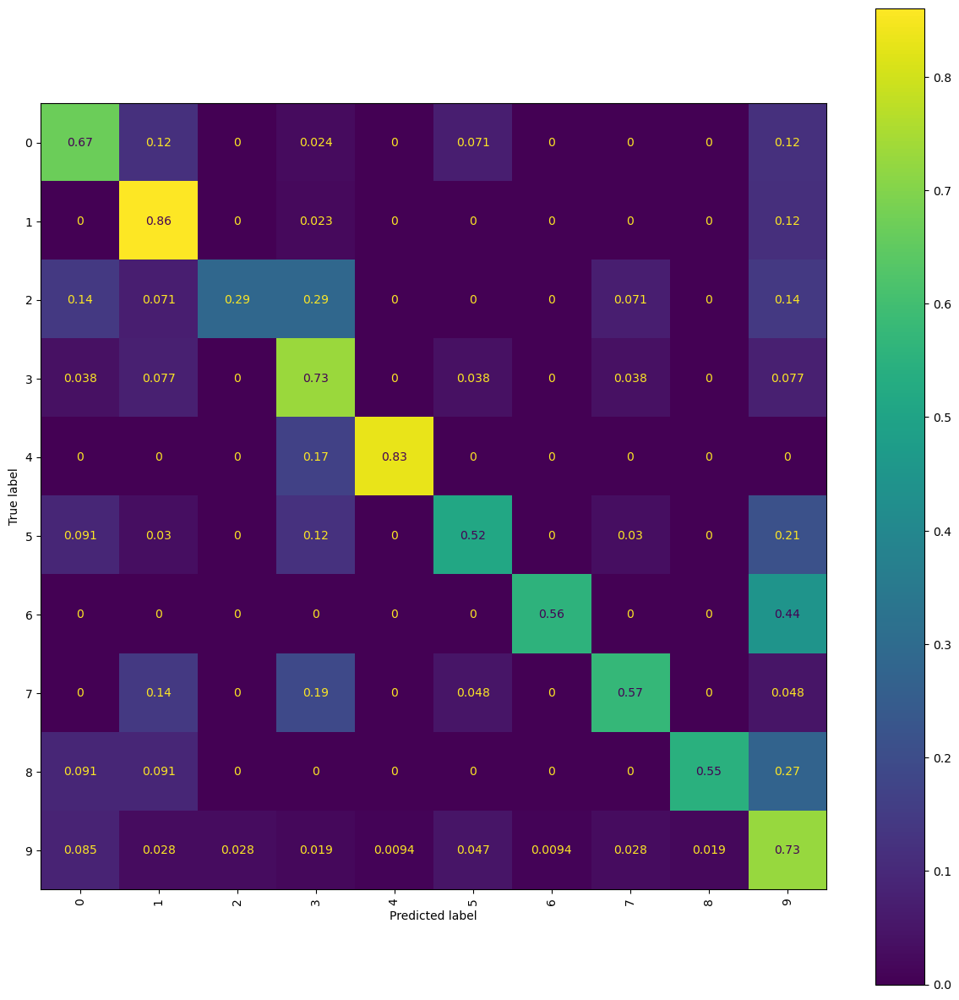

In [191]:
fig, ax = plt.subplots(figsize=(15, 15))
disp = ConfusionMatrixDisplay.from_estimator(best_nb_classifier, val_feature_vects, val_labels, normalize='true', xticks_rotation='vertical', ax=ax)

In [192]:
print(metrics.classification_report(val_labels, val_preds))

              precision    recall  f1-score   support

           0       0.64      0.67      0.65        42
           1       0.70      0.86      0.77        43
           2       0.57      0.29      0.38        14
           3       0.53      0.73      0.61        26
           4       0.83      0.83      0.83         6
           5       0.63      0.52      0.57        33
           6       0.83      0.56      0.67         9
           7       0.67      0.57      0.62        21
           8       0.75      0.55      0.63        11
           9       0.73      0.73      0.73       106

    accuracy                           0.68       311
   macro avg       0.69      0.63      0.65       311
weighted avg       0.68      0.68      0.67       311



Vamos testar/validar o nosso classificador agora!


In [193]:
text_classifier = Pipeline([
  ('vectorizer', TfidfVectorizer(tokenizer=spacy_tokenizer)),
  ('classifier', MultinomialNB(alpha=0.01))
])

In [194]:
%%time
text_classifier.fit(train_data, train_labels)

Wall time: 36.1 s


Pipeline(steps=[('vectorizer',
                 TfidfVectorizer(tokenizer=<function spacy_tokenizer at 0x0000027F01AADCA0>)),
                ('classifier', MultinomialNB(alpha=0.01))])

In [195]:
filtered_test_corpus = val_data

In [196]:
%%time
test_preds = text_classifier.predict(filtered_test_corpus)

Wall time: 6.6 s


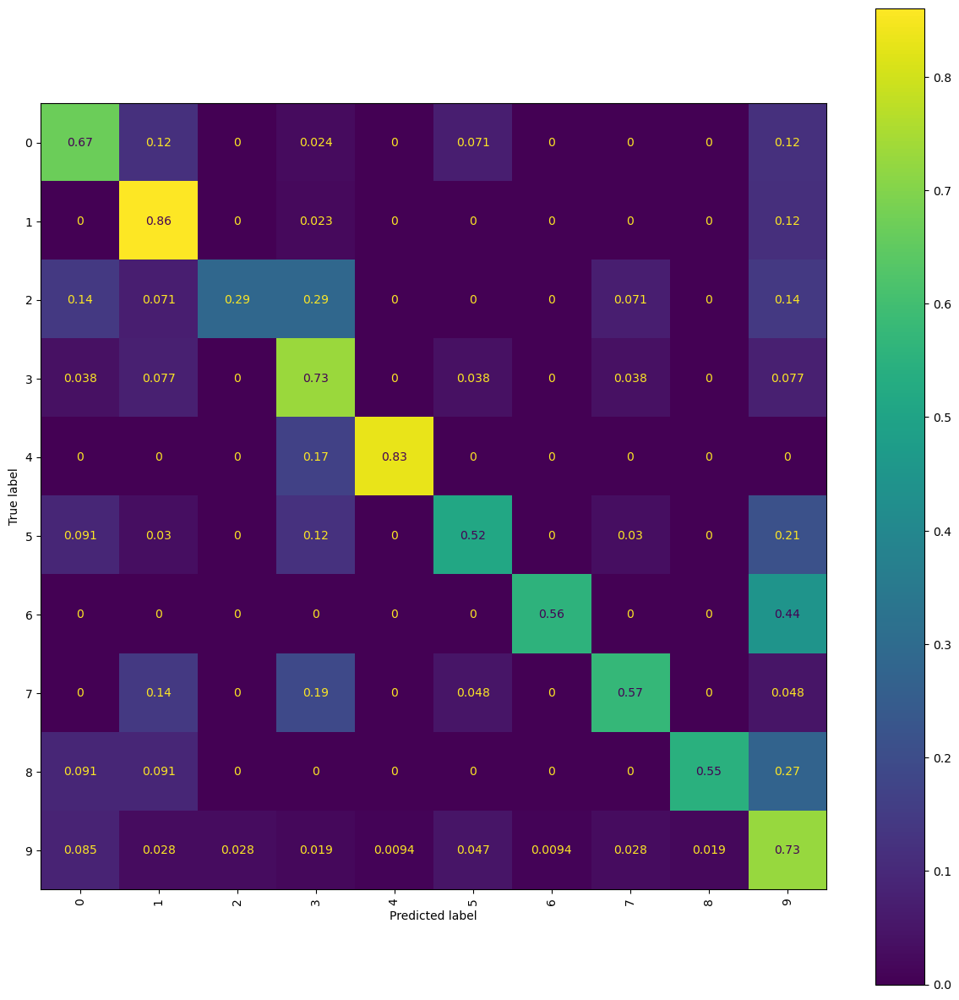

Wall time: 946 ms


In [197]:
%%time
fig, ax = plt.subplots(figsize=(15, 15))
ConfusionMatrixDisplay.from_predictions(val_labels, test_preds, normalize='true', xticks_rotation='vertical', ax=ax)
plt.show()

In [198]:
print(metrics.classification_report(val_labels, test_preds))

              precision    recall  f1-score   support

           0       0.64      0.67      0.65        42
           1       0.70      0.86      0.77        43
           2       0.57      0.29      0.38        14
           3       0.53      0.73      0.61        26
           4       0.83      0.83      0.83         6
           5       0.63      0.52      0.57        33
           6       0.83      0.56      0.67         9
           7       0.67      0.57      0.62        21
           8       0.75      0.55      0.63        11
           9       0.73      0.73      0.73       106

    accuracy                           0.68       311
   macro avg       0.69      0.63      0.65       311
weighted avg       0.68      0.68      0.67       311



Agora, vamos classificar novos documentos textuais!!

In [201]:
def classify_text(clf, doc, labels=None):
  probas = clf.predict_proba([doc]).flatten()
  max_proba_idx = np.argmax(probas)

  if labels:
    most_proba_class = labels[max_proba_idx]
  else:
    most_proba_class = max_proba_idx

  return (most_proba_class, probas[max_proba_idx])

In [210]:
print(type(filtered_test_corpus))
unique_values = filtered_test_corpus.unique()
unique_values = sorted(filtered_test_corpus.unique())

print(filtered_test_corpus)


<class 'pandas.core.series.Series'>
268     Cordycepin exerts neuroprotective effects exci...
577     effects potent agonist ( D-Pen2 , D-Pen5 ) enk...
481     glutamate-mediated synaptic responses neocorti...
1500    Mutations Na+-activated K+ channel Slack ( KCN...
1505    Intrinsic excitability plastic property cells ...
                              ...                        
612     previous studies treated spikes all-ornone eve...
1181    CA1 pyramidal neurons animals acquired hippoca...
697     Differences electrophysiological properties py...
87      assessed mechanism underlying glial cell-deriv...
772     Excitability response properties neuron may va...
Name: abstract, Length: 311, dtype: object


In [216]:
labels = sorted(filtered_test_corpus.unique())

##### Teste dos títulos